In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import os
import glob
from joblib import Parallel, delayed
import time
import matplotlib.pyplot as plt
import datetime
from sklearn.linear_model import LinearRegression
import plotly.express as px;
import sklearn
from sklearn import linear_model
from pylab import rcParams
import matplotlib
import itertools
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_percentage_error,
    mean_absolute_error,
    r2_score,
)
import pmdarima as pm

import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import seaborn as sns
from prophet import Prophet

In [2]:
def mean_percentage_error(y_true, y_pred):
    n = len(y_true)
    return (1 / n) * np.sum(((y_true - y_pred) / y_true) * 100)

In [3]:
plt.style.use('seaborn-whitegrid')

## Importações e tratamento das bases

### Total Brasil

In [4]:
path_atual = Path.cwd().parents[0]
path_atual

WindowsPath('C:/Users/ryanm/Downloads/Dados_consumo')

In [5]:
## Total Brasil
path_arquivos = path_atual / 'Dados de Input/Total_Brasil_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,Regiao,1/2023,2/2023,3/2023,4/2023,5/2023,6/2023,7/2023,8/2023,9/2023,...,4/2004,5/2004,6/2004,7/2004,8/2004,9/2004,10/2004,11/2004,12/2004,2004
0,TOTAL BRASIL,42813160.01,42897153.16,45712768.09,0,0,0,0,0,0,...,2.804618e+07,27244506.48,27082961.48,27346004.67,27656857.79,28232451.24,28556120.94,28367124.05,28562106.43,3.318652e+08
1,Sistemas Isolados,236778.45,224415.33,250001.21,0,0,0,0,0,0,...,5.382845e+05,536324.74,539349.62,552987.79,559476.95,583883.24,605454.49,598478.62,603585.35,6.696375e+06
2,Norte,3571001.43,3364942.54,3756768.95,0,0,0,0,0,0,...,1.813828e+06,1864450.35,1855964.81,1880414.32,1955054.82,1877031.93,1934410.53,1895128.83,1921259.37,2.231618e+07
3,Nordeste,6659376.85,6523348.22,6789724.06,0,0,0,0,0,0,...,3.733031e+06,3671927.06,3678192.44,3633963.60,3680491.54,3823779.58,3870290.34,3961920.55,4011821.36,4.485859e+07
4,Sudeste/C.Oeste,24029864.65,24162215.14,25958600.11,0,0,0,0,0,0,...,1.708773e+07,16448778.17,16452891.05,16679846.07,16808652.04,17293344.91,17555268.08,17382176.82,17360225.99,2.020503e+08


In [6]:
## mudando o formato

df = df.melt(id_vars=["Regiao"], 
        var_name="Data", 
        value_name="Valor")
df.head(2)

,Regiao,Data,Valor
0,TOTAL BRASIL,1/2023,42813160.01
1,Sistemas Isolados,1/2023,236778.45


In [7]:
## classificando dados anuais e mensais

df['NAME_Count'] = df['Data'].str.len()
df['NAME_Count'] = df['NAME_Count'].fillna(value=0)

df.loc[df['NAME_Count'] >= 6, 'Mes_ano'] = "Mes"
df.loc[df['NAME_Count'] == 0, 'Mes_ano'] = "Ano"
df.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL BRASIL,1/2023,42813160.01,6.0,Mes
1,Sistemas Isolados,1/2023,236778.45,6.0,Mes


In [8]:
## filtrando apenas dados mensais

df_mes = df[df["Mes_ano"] == "Mes"]
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL BRASIL,1/2023,42813160.01,6.0,Mes
1,Sistemas Isolados,1/2023,236778.45,6.0,Mes


In [9]:
## Alterando formato de data

df_mes['Data_padrao'] = pd.to_datetime(df_mes['Data'], format="%m/%Y")
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano,Data_padrao
0,TOTAL BRASIL,1/2023,42813160.01,6.0,Mes,2023-01-01
1,Sistemas Isolados,1/2023,236778.45,6.0,Mes,2023-01-01


In [10]:
#Tirando os valores com consumo = 0
df_mes = df_mes[(df_mes != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','Regiao'], as_index = False)['Valor'].sum()

In [11]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'Brasil_se.csv'), sep=';', index=False, encoding='latin1')

### Total Comercial

In [12]:
## Total Comercial
path_arquivos = path_atual / 'Dados de Input/Total_Comercial_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,Regiao,1/2023,2/2023,3/2023,4/2023,5/2023,6/2023,7/2023,8/2023,9/2023,...,4/2004,5/2004,6/2004,7/2004,8/2004,9/2004,10/2004,11/2004,12/2004,2004
0,TOTAL COMERCIAL (CATIVO + LIVRE),8078506.79,8173059.10,8592076.39,0,0,0,0,0,0,...,4447074.75,4105720.09,3840000.57,3887234.15,3867267.52,4121321.29,4187989.83,4233168.60,4400136.59,49685887.97
1,Sistemas Isolados,45914.04,43089.28,48263.82,0,0,0,0,0,0,...,104526.78,105032.28,103868.20,108434.46,108130.37,113016.56,115278.21,116499.42,115699.15,1300501.80
2,Norte,427987.29,405691.62,461525.20,0,0,0,0,0,0,...,131366.76,134405.99,137551.72,133558.49,139784.74,141883.17,138604.71,142038.12,142443.93,1618455.72
3,Nordeste,1176838.44,1166758.26,1164989.21,0,0,0,0,0,0,...,563104.08,527662.85,531328.17,497249.74,500262.21,531735.20,541976.77,570077.10,587623.86,6443836.65
4,Sudeste/C.Oeste,4898075.70,4932671.50,5256132.35,0,0,0,0,0,0,...,2904506.66,2642039.50,2439600.82,2511337.02,2473567.41,2669902.04,2735067.71,2727002.96,2823425.28,32066419.19


In [13]:
## mudando o formato

df = df.melt(id_vars=["Regiao"], 
        var_name="Data", 
        value_name="Valor")
df.head(2)

,Regiao,Data,Valor
0,TOTAL COMERCIAL (CATIVO + LIVRE),1/2023,8078506.79
1,Sistemas Isolados,1/2023,45914.04


In [14]:
## classificando dados anuais e mensais

df['NAME_Count'] = df['Data'].str.len()
df['NAME_Count'] = df['NAME_Count'].fillna(value=0)

df.loc[df['NAME_Count'] >= 6, 'Mes_ano'] = "Mes"
df.loc[df['NAME_Count'] == 0, 'Mes_ano'] = "Ano"
df.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL COMERCIAL (CATIVO + LIVRE),1/2023,8078506.79,6.0,Mes
1,Sistemas Isolados,1/2023,45914.04,6.0,Mes


In [15]:
## filtrando apenas dados mensais

df_mes = df[df["Mes_ano"] == "Mes"]
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL COMERCIAL (CATIVO + LIVRE),1/2023,8078506.79,6.0,Mes
1,Sistemas Isolados,1/2023,45914.04,6.0,Mes


In [16]:
## Alterando formato de data

df_mes['Data_padrao'] = pd.to_datetime(df_mes['Data'], format="%m/%Y")
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano,Data_padrao
0,TOTAL COMERCIAL (CATIVO + LIVRE),1/2023,8078506.79,6.0,Mes,2023-01-01
1,Sistemas Isolados,1/2023,45914.04,6.0,Mes,2023-01-01


In [17]:
#Tirando os valores com consumo = 0
df_mes = df_mes[(df_mes != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','Regiao'], as_index = False)['Valor'].sum()

In [18]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'Comercial_se.csv'), sep=';', index=False, encoding='latin1')

### Total Industrial

In [19]:
## Total Industrial
path_arquivos = path_atual / 'Dados de Input/Total_Industrial_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,Regiao,1/2023,2/2023,3/2023,4/2023,5/2023,6/2023,7/2023,8/2023,9/2023,...,4/2004,5/2004,6/2004,7/2004,8/2004,9/2004,10/2004,11/2004,12/2004,2004
0,TOTAL INDUSTRIAL (CATIVO + LIVRE),14941967.84,14596062.83,15970242.42,0,0,0,0,0,0,...,1.288729e+07,12832711.92,13107635.62,13306806.95,13592340.78,13460814.76,13534732.69,13447776.85,13391883.90,1.563207e+08
1,Sistemas Isolados,11754.42,10416.87,11704.74,0,0,0,0,0,0,...,1.303128e+05,132496.99,137601.63,143525.63,146170.24,148436.59,160103.87,151873.14,159282.00,1.687682e+06
2,Norte,1800224.14,1666105.30,1905095.29,0,0,0,0,0,0,...,1.286067e+06,1343709.62,1322740.77,1361651.37,1411125.24,1327842.84,1393156.12,1347041.63,1372203.73,1.598482e+07
3,Nordeste,1776650.26,1715769.70,1805125.90,0,0,0,0,0,0,...,1.506058e+06,1529798.44,1556041.72,1594110.73,1633061.91,1631989.20,1627862.44,1638651.46,1660236.45,1.876265e+07
4,Sudeste/C.Oeste,8517604.48,8431552.18,9057534.76,0,0,0,0,0,0,...,7.800091e+06,7661726.65,7948154.54,8037603.92,8178531.65,8202181.90,8223507.20,8282652.66,8204295.96,9.482355e+07


In [20]:
## mudando o formato

df = df.melt(id_vars=["Regiao"], 
        var_name="Data", 
        value_name="Valor")
df.head(2)

,Regiao,Data,Valor
0,TOTAL INDUSTRIAL (CATIVO + LIVRE),1/2023,14941967.84
1,Sistemas Isolados,1/2023,11754.42


In [21]:
## classificando dados anuais e mensais

df['NAME_Count'] = df['Data'].str.len()
df['NAME_Count'] = df['NAME_Count'].fillna(value=0)

df.loc[df['NAME_Count'] >= 6, 'Mes_ano'] = "Mes"
df.loc[df['NAME_Count'] == 0, 'Mes_ano'] = "Ano"
df.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL INDUSTRIAL (CATIVO + LIVRE),1/2023,14941967.84,6.0,Mes
1,Sistemas Isolados,1/2023,11754.42,6.0,Mes


In [22]:
## filtrando apenas dados mensais

df_mes = df[df["Mes_ano"] == "Mes"]
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL INDUSTRIAL (CATIVO + LIVRE),1/2023,14941967.84,6.0,Mes
1,Sistemas Isolados,1/2023,11754.42,6.0,Mes


In [23]:
## Alterando formato de data

df_mes['Data_padrao'] = pd.to_datetime(df_mes['Data'], format="%m/%Y")
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano,Data_padrao
0,TOTAL INDUSTRIAL (CATIVO + LIVRE),1/2023,14941967.84,6.0,Mes,2023-01-01
1,Sistemas Isolados,1/2023,11754.42,6.0,Mes,2023-01-01


In [24]:
#Tirando os valores com consumo = 0
df_mes = df_mes[(df_mes != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','Regiao'], as_index = False)['Valor'].sum()

In [25]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'Industrial_se.csv'), sep=';', index=False, encoding='latin1')

### Total Residencial

In [26]:
## Total Residencial
path_arquivos = path_atual / 'Dados de Input/Total_Residencial_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,Regiao,1/2023,2/2023,3/2023,4/2023,5/2023,6/2023,7/2023,8/2023,9/2023,...,4/2004,5/2004,6/2004,7/2004,8/2004,9/2004,10/2004,11/2004,12/2004,2004
0,TOTAL RESIDENCIAL,13310747.68,13680910.88,14313516.12,0,0,0,0,0,0,...,6809006.55,6477341.35,6291091.44,6292471.02,6304477.14,6604390.05,6606514.00,6631190.28,6643371.33,78470110.08
1,Sistemas Isolados,128896.69,121507.67,131374.13,0,0,0,0,0,0,...,185522.19,185742.21,180303.80,184593.12,183766.20,198490.62,201236.26,205321.22,200048.71,2290014.86
2,Norte,961166.08,932188.89,985627.51,0,0,0,0,0,0,...,250471.83,242233.22,246515.78,236277.18,250972.80,253397.00,251008.96,256041.33,253338.20,2946386.62
3,Nordeste,2462395.73,2437493.50,2519264.24,0,0,0,0,0,0,...,1009821.61,945780.84,915753.89,885059.64,875228.74,949753.12,956482.72,993362.91,1015897.71,11440930.82
4,Sudeste/C.Oeste,7410417.59,7584607.85,8173397.17,0,0,0,0,0,0,...,4231143.85,4021482.51,3891667.84,3919836.24,3924317.00,4102192.03,4128307.73,4104974.94,4073519.58,48680284.34


In [27]:
## mudando o formato

df = df.melt(id_vars=["Regiao"], 
        var_name="Data", 
        value_name="Valor")
df.head(2)

,Regiao,Data,Valor
0,TOTAL RESIDENCIAL,1/2023,13310747.68
1,Sistemas Isolados,1/2023,128896.69


In [28]:
## classificando dados anuais e mensais

df['NAME_Count'] = df['Data'].str.len()
df['NAME_Count'] = df['NAME_Count'].fillna(value=0)

df.loc[df['NAME_Count'] >= 6, 'Mes_ano'] = "Mes"
df.loc[df['NAME_Count'] == 0, 'Mes_ano'] = "Ano"
df.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL RESIDENCIAL,1/2023,13310747.68,6.0,Mes
1,Sistemas Isolados,1/2023,128896.69,6.0,Mes


In [29]:
## filtrando apenas dados mensais

df_mes = df[df["Mes_ano"] == "Mes"]
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL RESIDENCIAL,1/2023,13310747.68,6.0,Mes
1,Sistemas Isolados,1/2023,128896.69,6.0,Mes


In [30]:
## Alterando formato de data

df_mes['Data_padrao'] = pd.to_datetime(df_mes['Data'], format="%m/%Y")
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano,Data_padrao
0,TOTAL RESIDENCIAL,1/2023,13310747.68,6.0,Mes,2023-01-01
1,Sistemas Isolados,1/2023,128896.69,6.0,Mes,2023-01-01


In [31]:
#Tirando os valores com consumo = 0
df_mes = df_mes[(df_mes != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','Regiao'], as_index = False)['Valor'].sum()

In [32]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'Residencial_se.csv'), sep=';', index=False, encoding='latin1')

### Total Outros

In [33]:
## Total Industrial
path_arquivos = path_atual / 'Dados de Input/Total_Outros_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,Regiao,1/2023,2/2023,3/2023,4/2023,5/2023,6/2023,7/2023,8/2023,9/2023,...,4/2004,5/2004,6/2004,7/2004,8/2004,9/2004,10/2004,11/2004,12/2004,2004
0,TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇ...,6481937.70,6447120.35,6836933.16,0,0,0,0,0,0,...,3902810.32,3828733.12,3844233.85,3859492.55,3892772.35,4045925.14,4226884.42,4054988.32,4126714.61,47388500.20
1,Sistemas Isolados,50213.30,49401.51,58658.52,0,0,0,0,0,0,...,117922.71,113053.26,117575.99,116434.58,121410.14,123939.47,128836.15,124784.84,128555.49,1418176.59
2,Norte,381623.92,360956.73,404520.95,0,0,0,0,0,0,...,145922.11,144101.52,149156.54,148927.28,153172.04,153908.92,151640.74,150007.75,153273.51,1766513.83
3,Nordeste,1243492.42,1203326.76,1300344.71,0,0,0,0,0,0,...,654047.40,668684.93,675068.66,657543.49,671938.68,710302.06,743968.41,759829.08,748063.34,8211174.42
4,Sudeste/C.Oeste,3203766.88,3213383.61,3471535.83,0,0,0,0,0,0,...,2151986.70,2123529.51,2173467.85,2211068.89,2232235.98,2319068.94,2468385.44,2267546.26,2258985.17,26480047.93


In [34]:
## mudando o formato

df = df.melt(id_vars=["Regiao"], 
        var_name="Data", 
        value_name="Valor")
df.head(2)

,Regiao,Data,Valor
0,TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇ...,1/2023,6481937.7
1,Sistemas Isolados,1/2023,50213.3


In [35]:
## classificando dados anuais e mensais

df['NAME_Count'] = df['Data'].str.len()
df['NAME_Count'] = df['NAME_Count'].fillna(value=0)

df.loc[df['NAME_Count'] >= 6, 'Mes_ano'] = "Mes"
df.loc[df['NAME_Count'] == 0, 'Mes_ano'] = "Ano"
df.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇ...,1/2023,6481937.7,6.0,Mes
1,Sistemas Isolados,1/2023,50213.3,6.0,Mes


In [36]:
## filtrando apenas dados mensais

df_mes = df[df["Mes_ano"] == "Mes"]
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano
0,TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇ...,1/2023,6481937.7,6.0,Mes
1,Sistemas Isolados,1/2023,50213.3,6.0,Mes


In [37]:
## Alterando formato de data

df_mes['Data_padrao'] = pd.to_datetime(df_mes['Data'], format="%m/%Y")
df_mes.head(2)

,Regiao,Data,Valor,NAME_Count,Mes_ano,Data_padrao
0,TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇ...,1/2023,6481937.7,6.0,Mes,2023-01-01
1,Sistemas Isolados,1/2023,50213.3,6.0,Mes,2023-01-01


In [38]:
#Tirando os valores com consumo = 0
df_mes = df_mes[(df_mes != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','Regiao'], as_index = False)['Valor'].sum()

In [39]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'Outros_se.csv'), sep=';', index=False, encoding='latin1')

### Total UF

In [40]:
## Total São Paulo
path_arquivos = path_atual / 'Dados de Input/SP_SE.xlsx'
df = pd.read_excel(path_arquivos)
df.head()

,SÃO PAULO,2004-01-01 00:00:00,2004-02-01 00:00:00,2004-03-01 00:00:00,2004-04-01 00:00:00,2004-05-01 00:00:00,2004-06-01 00:00:00,2004-07-01 00:00:00,2004-08-01 00:00:00,2004-09-01 00:00:00,...,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,2023-06-01 00:00:00,2023-07-01 00:00:00,2023-08-01 00:00:00,2023-09-01 00:00:00,2023-10-01 00:00:00,2023-11-01 00:00:00,2023-12-01 00:00:00
0,TOTAL,7976304.95,7919049.63,8116797.54,8623046.79,8096487.86,8191582.41,8302446.25,8389078.03,8605471.39,...,11896633.73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,RESIDENCIAL,2074540.88,1980655.12,2058328.09,2169642.61,2041061.68,2039384.38,2066713.34,2074704.65,2122526.57,...,3885347.90,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,INDUSTRIAL,3499333.91,3641580.49,3677373.42,3913242.19,3753889.16,3936932.41,3953979.88,4052294.36,4120856.27,...,4126732.76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,COMERCIAL,1464892.15,1421227.88,1416475.73,1579355.76,1386690.46,1280006.82,1348601.71,1324733.31,1430715.57,...,2643572.95,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,OUTROS,937538.01,875586.14,964620.30,960806.23,914846.56,935258.80,933151.32,937345.71,931372.98,...,1240980.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
## mudando o formato

df = df.melt(id_vars=["SÃO PAULO"], 
        var_name="Data", 
        value_name="Valor")
df.head()

,SÃO PAULO,Data,Valor
0,TOTAL,2004-01-01,7976304.95
1,RESIDENCIAL,2004-01-01,2074540.88
2,INDUSTRIAL,2004-01-01,3499333.91
3,COMERCIAL,2004-01-01,1464892.15
4,OUTROS,2004-01-01,937538.01


In [42]:
## Alterando formato de data

df['Data_padrao'] = pd.to_datetime(df['Data'], format="%m/%Y")
df.head(2)

,SÃO PAULO,Data,Valor,Data_padrao
0,TOTAL,2004-01-01,7976304.95,2004-01-01
1,RESIDENCIAL,2004-01-01,2074540.88,2004-01-01


In [43]:
#Tirando os valores com consumo = 0
df_mes = df[(df != 0).all(1)]

#Agrupando os dados na dimensão temporal, espacial e por regiao
df_mes = df_mes.groupby(['Data_padrao','SÃO PAULO'], as_index = False)['Valor'].sum()

In [44]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
df_mes.to_csv(os.path.join(path,r'SP_se.csv'), sep=';', index=False, encoding='latin1')

## Dataframe selecionado

In [45]:
## Total Brasil
path_trabalhado = path_atual / 'Dados de Input/Bases Trabalhadas'
df1 = pd.read_csv(os.path.join(path_trabalhado,r'Brasil_se.csv'), sep =';')
df1.head(6)

,Data_padrao,Regiao,Valor
0,2004-01-01,Nordeste,3719426.79
1,2004-01-01,Norte,1795206.56
2,2004-01-01,Sistemas Isolados,537166.33
3,2004-01-01,Sudeste/C.Oeste,16416445.30
4,2004-01-01,Sul,4510113.04
5,2004-01-01,TOTAL BRASIL,26978358.02


In [46]:
## Outras bases
df2 = pd.read_csv(os.path.join(path_trabalhado,r'Comercial_se.csv'), sep =';', encoding = 'latin1')
df3 = pd.read_csv(os.path.join(path_trabalhado,r'Industrial_se.csv'), sep =';', encoding = 'latin1')
df4 = pd.read_csv(os.path.join(path_trabalhado,r'Outros_se.csv'), sep =';', encoding = 'latin1')
df5 = pd.read_csv(os.path.join(path_trabalhado,r'Residencial_se.csv'), sep =';', encoding = 'latin1')
df6 = pd.read_csv(os.path.join(path_trabalhado,r'SP_se.csv'), sep =';', encoding = 'latin1')

In [47]:
## Removendo zeros de sp

df6 = df6[df6['Valor'] != 0]

In [48]:
## Filtrando apenas BR e Sudeste

df_total_brasil = df1[df1["Regiao"] == "TOTAL BRASIL"]
df_total_sudeste = df1[df1["Regiao"] == 'Sudeste/C.Oeste']
df_total_sp = df6[df6["SÃO PAULO"] == 'TOTAL']

df_comercial_brasil = df2[df2["Regiao"] == "TOTAL COMERCIAL (CATIVO + LIVRE)"]
df_comercial_sudeste = df2[df2["Regiao"] == 'Sudeste/C.Oeste']
df_comercial_sp = df6[df6["SÃO PAULO"] == 'COMERCIAL']

df_industrial_brasil = df3[df3["Regiao"] == "TOTAL INDUSTRIAL (CATIVO + LIVRE)"]
df_industrial_sudeste = df3[df3["Regiao"] == 'Sudeste/C.Oeste']
df_industrial_sp = df6[df6["SÃO PAULO"] == 'INDUSTRIAL']

df_outros_brasil = df4[df4["Regiao"] == "TOTAL OUTROS (RURAL + ILUMINAÇÃO PUB. + SERVIÇO PUB. + PODER PUB. + CONSUMO PRÓPRIO)"]
df_outros_sudeste = df4[df4["Regiao"] == 'Sudeste/C.Oeste']
df_outros_sp = df6[df6["SÃO PAULO"] == 'OUTROS']

df_residencial_brasil = df5[df5["Regiao"] == "TOTAL RESIDENCIAL"]
df_residencial_sudeste = df5[df5["Regiao"] == 'Sudeste/C.Oeste']
df_residencial_sp = df6[df6["SÃO PAULO"] == 'RESIDENCIAL']

In [49]:
## Colunas com granularidade

df_total_brasil['Granularidade'] = 'Total Brasil'
df_total_sudeste['Granularidade'] = 'Total Sudeste_C_Oeste'
df_total_sp['Granularidade'] = 'Total São Paulo'

df_comercial_brasil['Granularidade'] = 'Comercial Brasil'
df_comercial_sudeste['Granularidade'] = 'Comercial Sudeste_C_Oeste'
df_comercial_sp['Granularidade'] = 'Comercial São Paulo'

df_industrial_brasil['Granularidade'] = 'Industrial Brasil'
df_industrial_sudeste['Granularidade'] = 'Industrial Sudeste_C_Oeste'
df_industrial_sp['Granularidade'] = 'Industrial São Paulo'

df_outros_brasil['Granularidade'] = 'Outros Brasil'
df_outros_sudeste['Granularidade'] = 'Outros Sudeste_C_Oeste'
df_outros_sp['Granularidade'] = 'Outros São Paulo'

df_residencial_brasil['Granularidade'] = 'Residencial Brasil'
df_residencial_sudeste['Granularidade'] = 'Residencial Sudeste_C_Oeste'
df_residencial_sp['Granularidade'] = 'Residencial São Paulo'

In [50]:
df_residencial_sp

,Data_padrao,SÃO PAULO,Valor,Granularidade
3,2004-01-01,RESIDENCIAL,2074540.88,Residencial São Paulo
8,2004-02-01,RESIDENCIAL,1980655.12,Residencial São Paulo
13,2004-03-01,RESIDENCIAL,2058328.09,Residencial São Paulo
18,2004-04-01,RESIDENCIAL,2169642.61,Residencial São Paulo
23,2004-05-01,RESIDENCIAL,2041061.68,Residencial São Paulo
...,...,...,...,...
1133,2022-11-01,RESIDENCIAL,3599979.27,Residencial São Paulo
1138,2022-12-01,RESIDENCIAL,3773234.41,Residencial São Paulo
1143,2023-01-01,RESIDENCIAL,3597226.14,Residencial São Paulo
1148,2023-02-01,RESIDENCIAL,3681363.98,Residencial São Paulo


In [51]:
## Criando um data frame único

merged_df = pd.concat([df_total_brasil, df_total_sudeste, df_total_sp, df_comercial_brasil, df_comercial_sudeste, df_comercial_sp, df_industrial_brasil,
                      df_industrial_sudeste, df_industrial_sp, df_outros_brasil, df_outros_sudeste, df_outros_sp, df_residencial_brasil, df_residencial_sudeste, df_residencial_sp])
merged_df = merged_df[['Data_padrao', 'Granularidade', 'Valor']]
merged_df

,Data_padrao,Granularidade,Valor
5,2004-01-01,Total Brasil,2.697836e+07
11,2004-02-01,Total Brasil,2.650817e+07
17,2004-03-01,Total Brasil,2.728433e+07
23,2004-04-01,Total Brasil,2.804618e+07
29,2004-05-01,Total Brasil,2.724451e+07
...,...,...,...
1133,2022-11-01,Residencial São Paulo,3.599979e+06
1138,2022-12-01,Residencial São Paulo,3.773234e+06
1143,2023-01-01,Residencial São Paulo,3.597226e+06
1148,2023-02-01,Residencial São Paulo,3.681364e+06


In [52]:
## salvando os dados

path = path_atual / 'Dados de input/Bases trabalhadas'
merged_df.to_csv(os.path.join(path,r'Base_final.csv'), sep=';', index=False, encoding='latin1')

## Analise e limpeza de dados

In [53]:
## Base final
df_final = pd.read_csv(os.path.join(path_trabalhado,r'Base_final.csv'), sep =';', encoding='latin1')
df_final

,Data_padrao,Granularidade,Valor
0,2004-01-01,Total Brasil,2.697836e+07
1,2004-02-01,Total Brasil,2.650817e+07
2,2004-03-01,Total Brasil,2.728433e+07
3,2004-04-01,Total Brasil,2.804618e+07
4,2004-05-01,Total Brasil,2.724451e+07
...,...,...,...
3460,2022-11-01,Residencial São Paulo,3.599979e+06
3461,2022-12-01,Residencial São Paulo,3.773234e+06
3462,2023-01-01,Residencial São Paulo,3.597226e+06
3463,2023-02-01,Residencial São Paulo,3.681364e+06


In [54]:
df_final['Data_padrao'] = pd.to_datetime(df_final['Data_padrao'], format='%Y-%m-%d')
df_final

,Data_padrao,Granularidade,Valor
0,2004-01-01,Total Brasil,2.697836e+07
1,2004-02-01,Total Brasil,2.650817e+07
2,2004-03-01,Total Brasil,2.728433e+07
3,2004-04-01,Total Brasil,2.804618e+07
4,2004-05-01,Total Brasil,2.724451e+07
...,...,...,...
3460,2022-11-01,Residencial São Paulo,3.599979e+06
3461,2022-12-01,Residencial São Paulo,3.773234e+06
3462,2023-01-01,Residencial São Paulo,3.597226e+06
3463,2023-02-01,Residencial São Paulo,3.681364e+06


In [55]:
## Criando uma lista com as series temporais

lista_regiao = df_final['Granularidade'].unique()

series_temporais = []
for i in lista_regiao:
    Grupo = df_final[(df_final['Granularidade'].str.contains(i))]
    series_temporais.append(Grupo)
series_temporais

[    Data_padrao Granularidade         Valor
 0    2004-01-01  Total Brasil  2.697836e+07
 1    2004-02-01  Total Brasil  2.650817e+07
 2    2004-03-01  Total Brasil  2.728433e+07
 3    2004-04-01  Total Brasil  2.804618e+07
 4    2004-05-01  Total Brasil  2.724451e+07
 ..          ...           ...           ...
 226  2022-11-01  Total Brasil  4.277662e+07
 227  2022-12-01  Total Brasil  4.335334e+07
 228  2023-01-01  Total Brasil  4.281316e+07
 229  2023-02-01  Total Brasil  4.289715e+07
 230  2023-03-01  Total Brasil  4.571277e+07
 
 [231 rows x 3 columns],
     Data_padrao          Granularidade         Valor
 231  2004-01-01  Total Sudeste_C_Oeste  1.641645e+07
 232  2004-02-01  Total Sudeste_C_Oeste  1.614975e+07
 233  2004-03-01  Total Sudeste_C_Oeste  1.641519e+07
 234  2004-04-01  Total Sudeste_C_Oeste  1.708773e+07
 235  2004-05-01  Total Sudeste_C_Oeste  1.644878e+07
 ..          ...                    ...           ...
 457  2022-11-01  Total Sudeste_C_Oeste  2.442397e+07
 

In [56]:
for serie in series_temporais:
    serie.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 231 entries, 0 to 230
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Data_padrao    231 non-null    datetime64[ns]
 1   Granularidade  231 non-null    object        
 2   Valor          231 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 7.2+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 231 entries, 231 to 461
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Data_padrao    231 non-null    datetime64[ns]
 1   Granularidade  231 non-null    object        
 2   Valor          231 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 7.2+ KB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 231 entries, 462 to 692
Data columns (total 3 columns):
 #   Column         Non-Null Cou

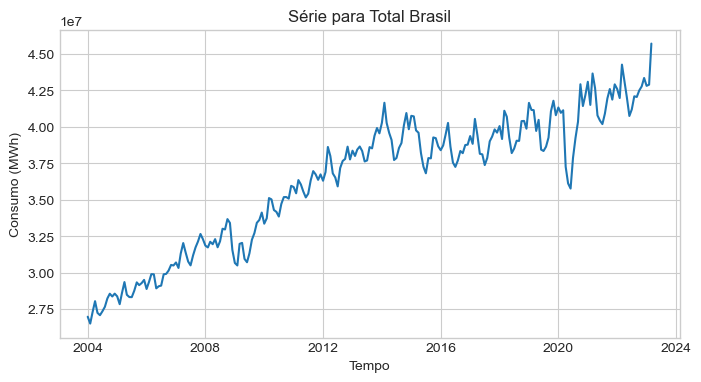

In [57]:
##Plotando as series de dados

primeira_serie = series_temporais[0]
plt.figure(figsize=(8, 4))
plt.plot(primeira_serie['Data_padrao'].values, primeira_serie['Valor'].values)
plt.title(f'Série para {lista_regiao[0]}')
plt.xlabel('Tempo')
plt.ylabel('Consumo (MWh)')
plt.savefig("series/" + "Total Brasil" + ".png", bbox_inches="tight")
plt.show()

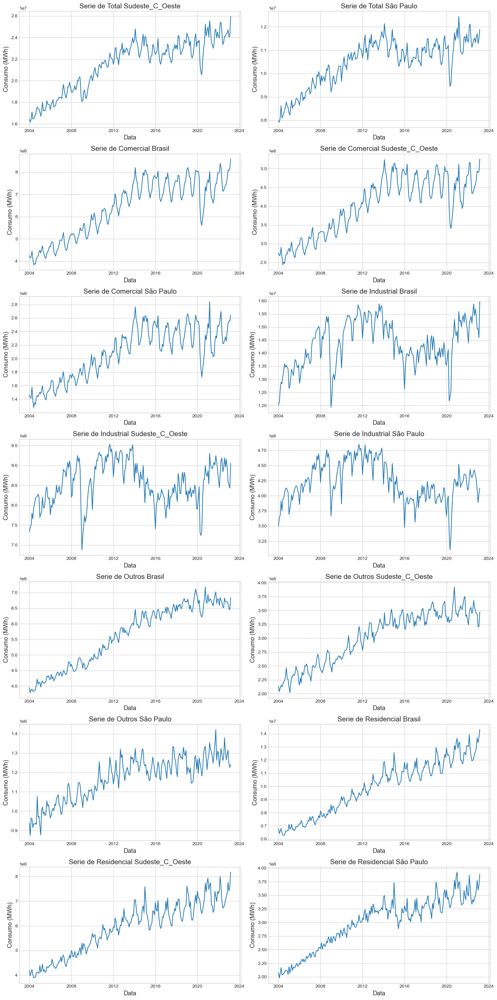

In [58]:
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 30))

for serie, grupo, ax in zip(series_temporais[1:], lista_regiao[1:], axs.flat):
    #plt.figure(figsize=(10,6))
    ax.plot(serie['Data_padrao'].values, serie['Valor'].values)
    ax.set_title("Serie de " + grupo,fontsize=15)
    ax.set_xlabel("Data",fontsize=13)
    ax.set_ylabel("Consumo (MWh)",fontsize=13)
    
plt.tight_layout()
plt.savefig("series/" + "Series temporais" + ".png", bbox_inches="tight")
plt.show()

## Decomposição para os parametros de sazonlidade, tendencia

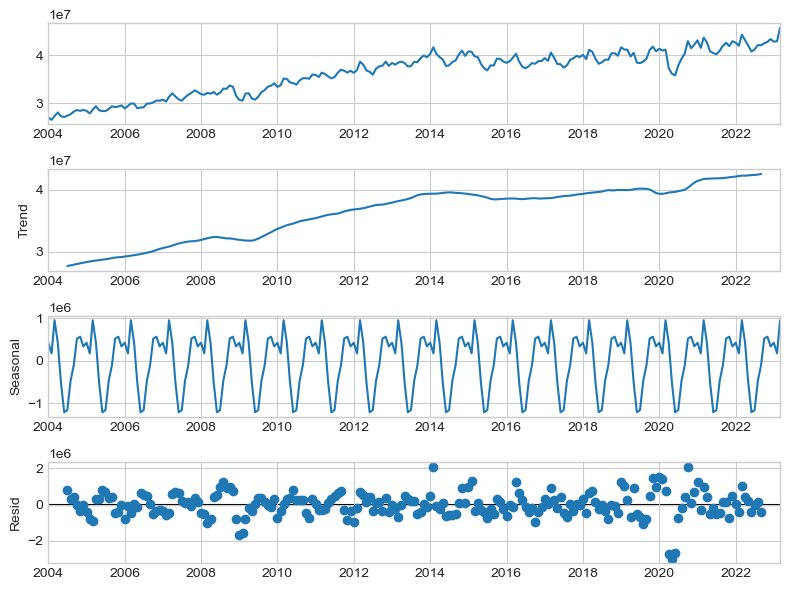

<Figure size 800x600 with 0 Axes>

In [59]:
##Plotando as series de dados

serie = primeira_serie.drop(columns=['Granularidade'])
serie = serie.set_index('Data_padrao')  
rcParams['figure.figsize'] = 8, 6
decomposition = sm.tsa.seasonal_decompose(serie, model='additive')    
fig = decomposition.plot()
#plt.title("Serie de Total Brasil",fontsize=12)
plt.show()

plt.savefig("Total Brasil decomposição" + ".png", bbox_inches="tight")

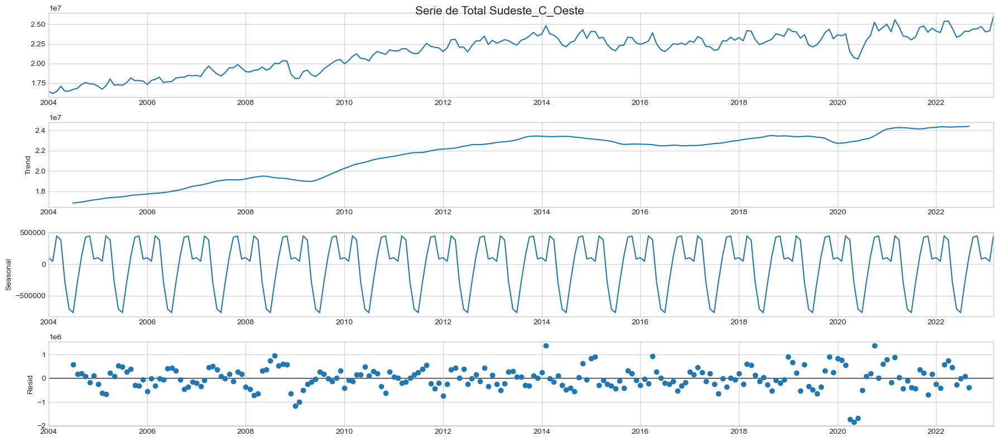

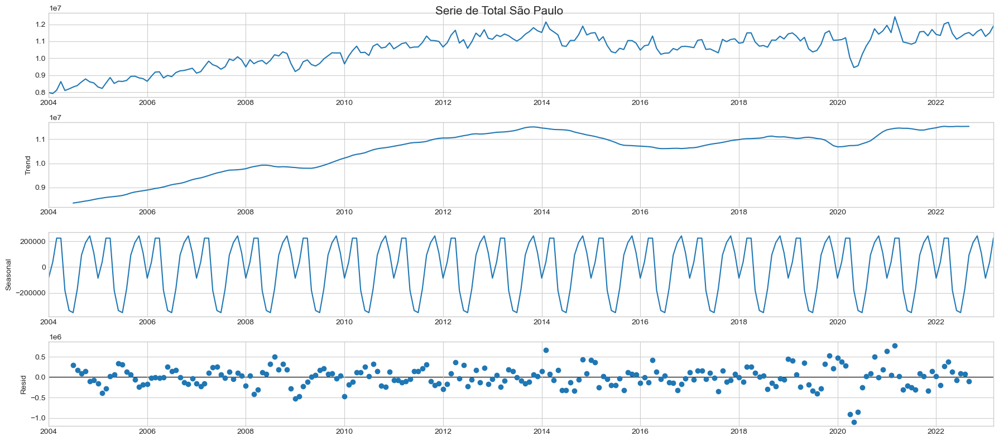

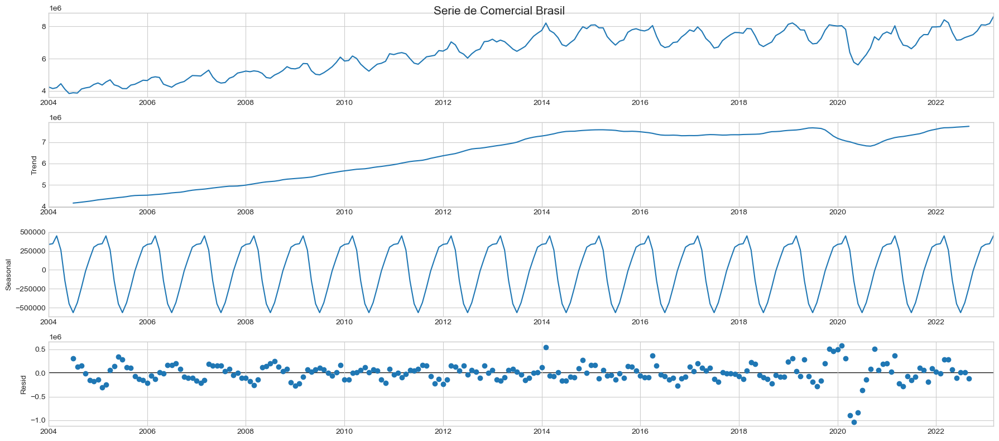

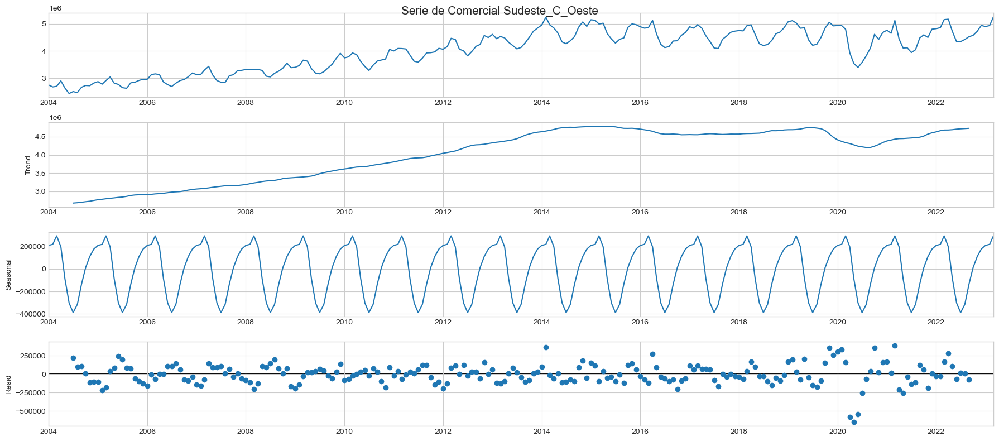

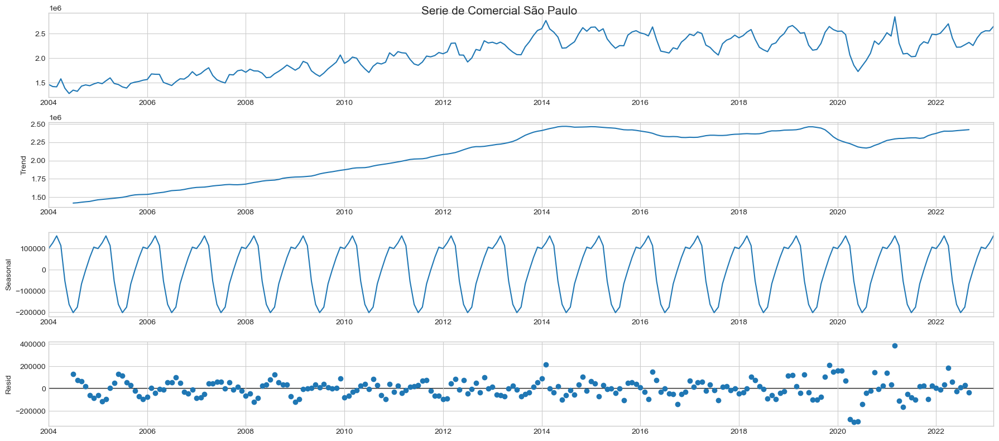

...

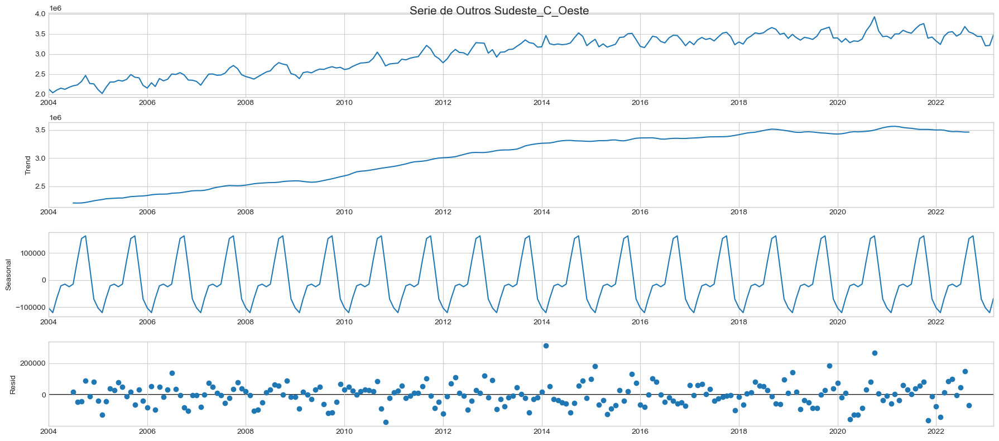

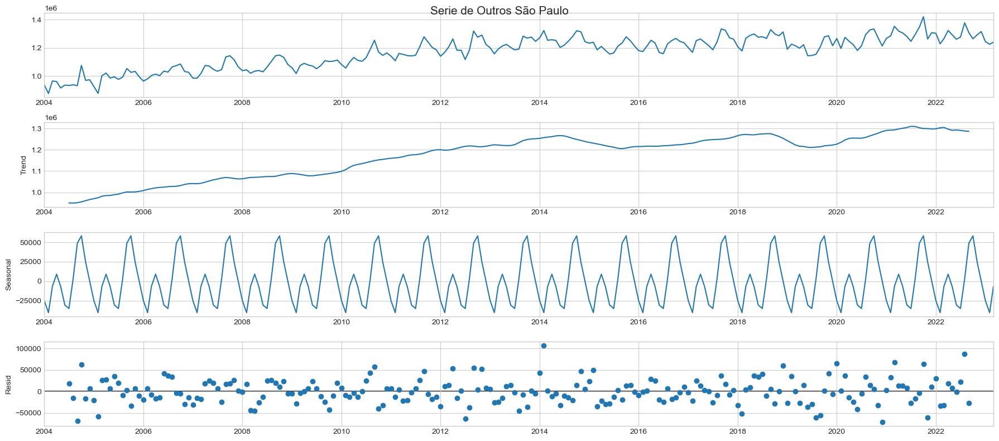

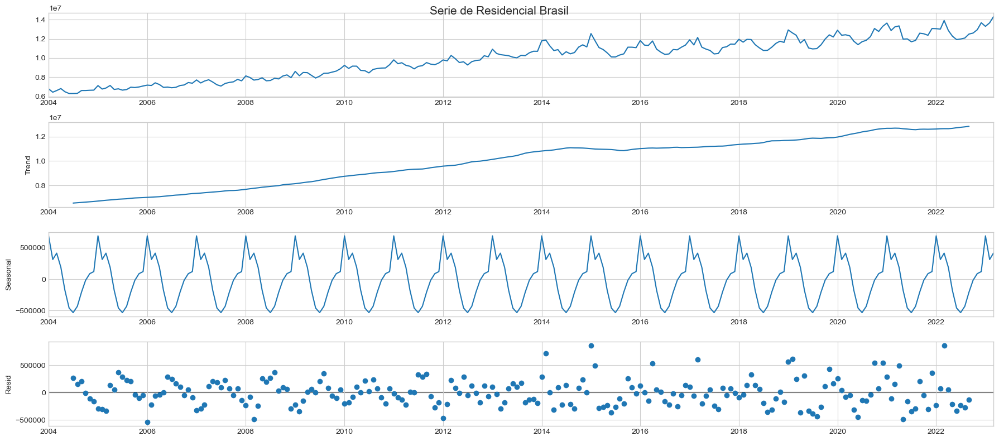

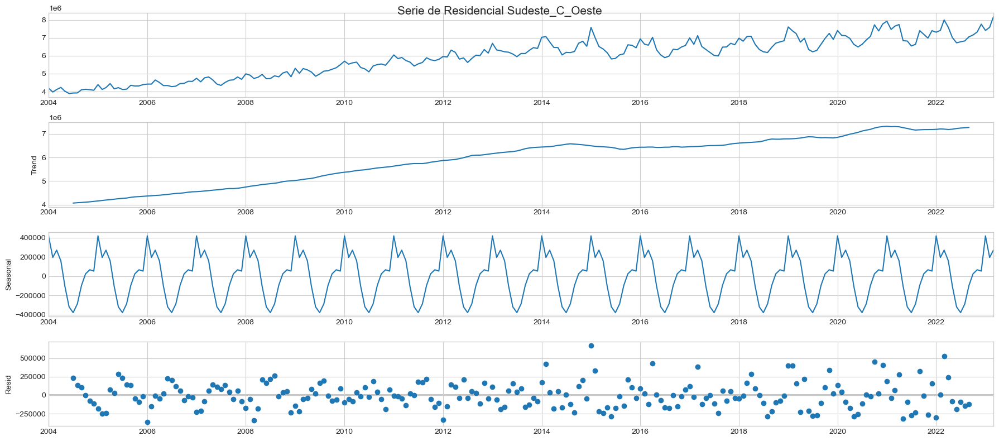

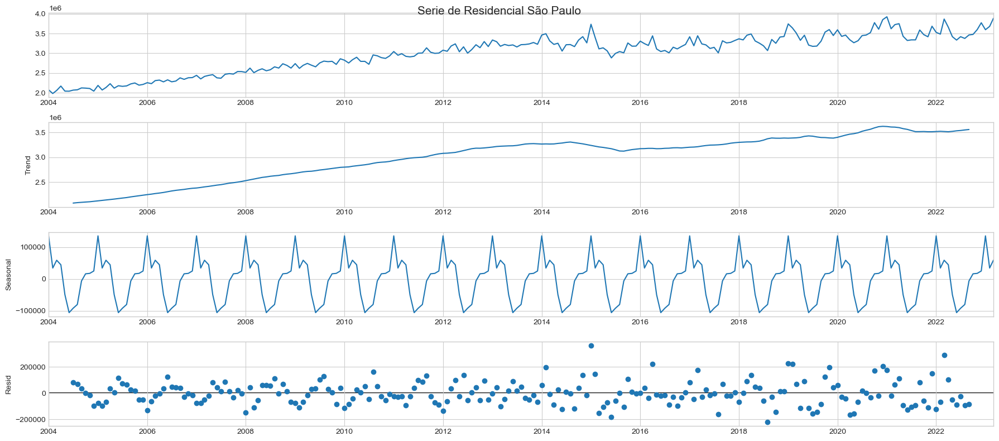

In [60]:
for serie, categoria in zip(series_temporais[1:], lista_regiao[1:]):
    serie = serie.drop(columns=['Granularidade'])
    serie = serie.set_index('Data_padrao')  
    rcParams['figure.figsize'] = 18, 8
    decomposition = sm.tsa.seasonal_decompose(serie, model='additive')    
    fig = decomposition.plot()
    fig.suptitle("Serie de " + categoria,fontsize=15)
    plt.savefig("decomposicoes" + categoria + ".png", bbox_inches="tight")
    plt.show()

In [61]:
from PIL import Image

categorias_desejadas = ["Total", "Comercial", "Industrial", "Residencial", "Outros"]

for inicial in set(c[0] for c in categorias_desejadas):
    images = [Image.open("decomposicoes" + categoria + ".png") for categoria in lista_regiao[1:] if categoria.startswith(inicial)]
    total_width = max(img.width for img in images)
    total_height = sum(img.height for img in images)
    combined_image = Image.new('RGB', (total_width, total_height))
    
    y_offset = 0
    for img in images:
        combined_image.paste(img, (0, y_offset))
        y_offset += img.height

    combined_image.save("todas_decomposicoes_" + inicial + ".png")
    combined_image.show()

## Definição do melhor périodo de treinamento

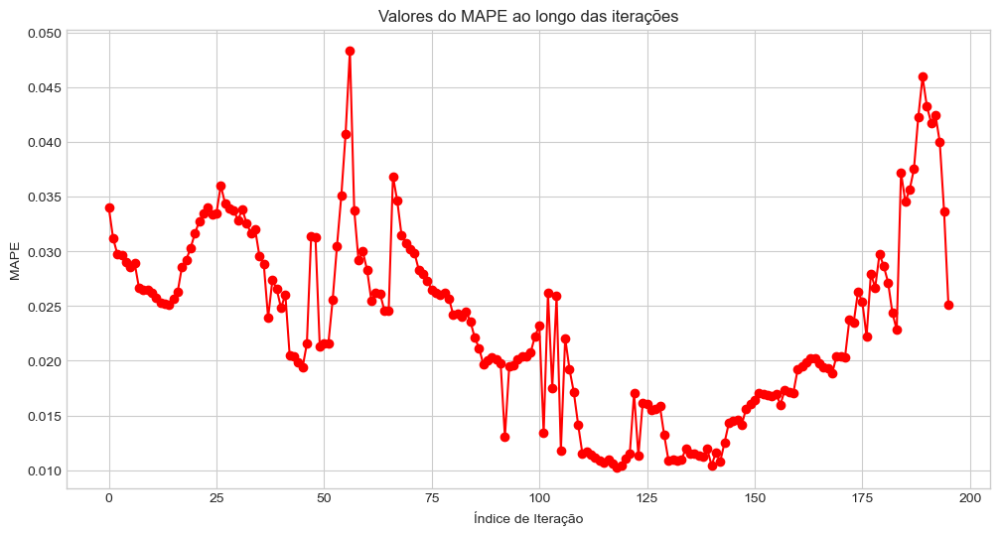

In [62]:
## Escolhendo o melhor treinamento para os modelos

from statsmodels.tsa.holtwinters import ExponentialSmoothing

primeira_serie = series_temporais[0]
test_length = 36
mape_values = []

for i in range(0, len(primeira_serie) - test_length + 1):
    train = primeira_serie.groupby(['Data_padrao'])['Valor'].sum()
    test = primeira_serie.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[i:-12]
    test = test.iloc[-12:]
    model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=12)
    fit = model.fit()
    pred = fit.forecast(12)
    mape = mean_absolute_percentage_error(test, pred)
    mape_values.append(mape)

    
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(mape_values, marker='o', linestyle='-', color='red');
ax.set_xlabel('Índice de Iteração')
ax.set_ylabel('MAPE')
ax.set_title('Valores do MAPE ao longo das iterações')
plt.savefig("mape_values", bbox_inches="tight")
plt.show()

In [63]:
min_mape = min(mape_values)
min_index = mape_values.index(min_mape)
corresponding_i = min_index

min_mape,corresponding_i

(0.01026144899839912, 118)

## Teste vs treino

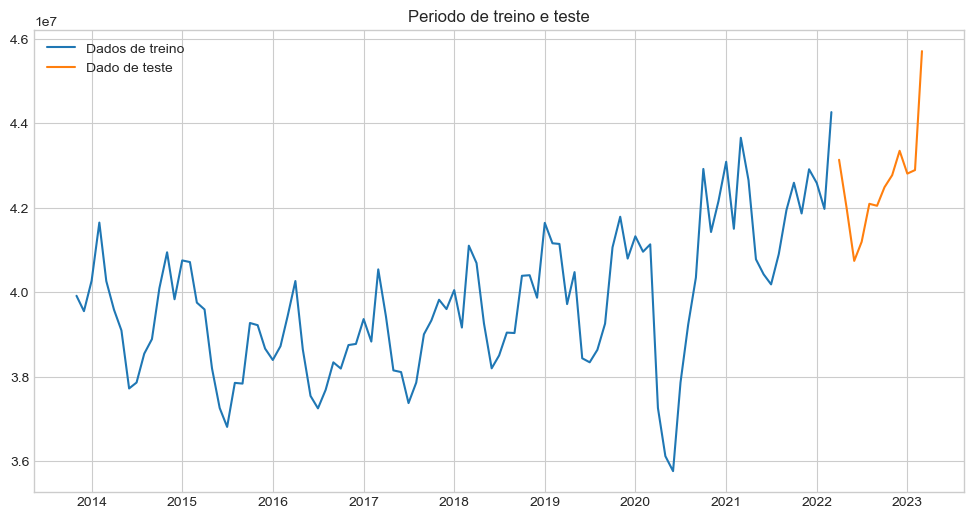

In [64]:
train = primeira_serie.groupby(['Data_padrao'])['Valor'].sum()
test = primeira_serie.groupby(['Data_padrao'])['Valor'].sum()
train = train.iloc[118:-12]
test = test.iloc[-12:]

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(train, label='Dados de treino');
ax.plot(test, label='Dado de teste');
ax.legend();
ax.set_title("Periodo de treino e teste");
plt.savefig("train_test", bbox_inches="tight")
plt.show()

## Média móvel (dummy)

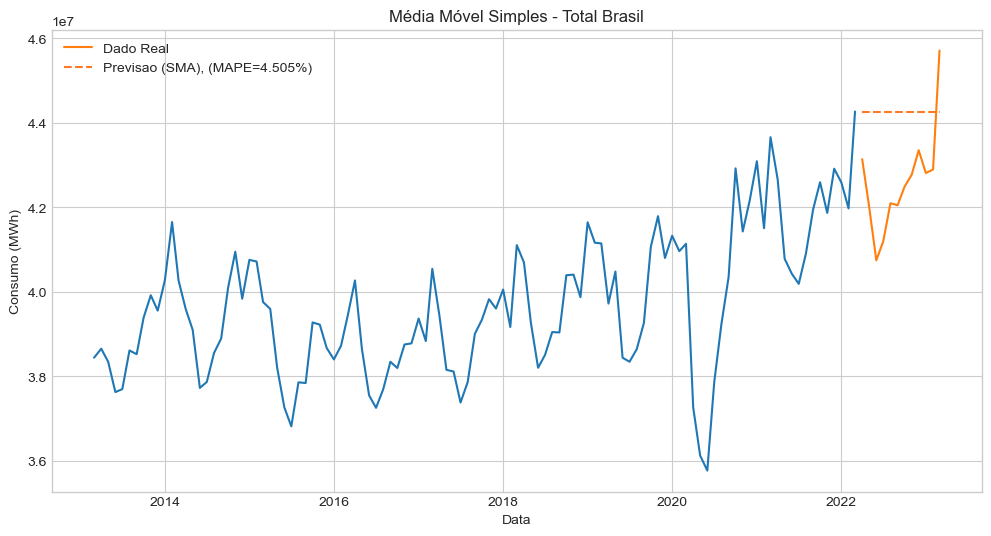

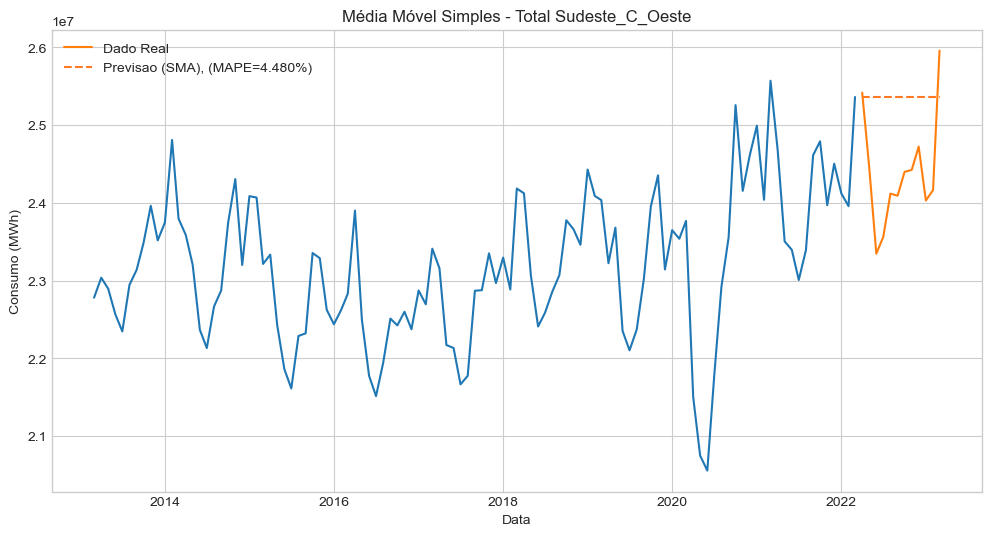

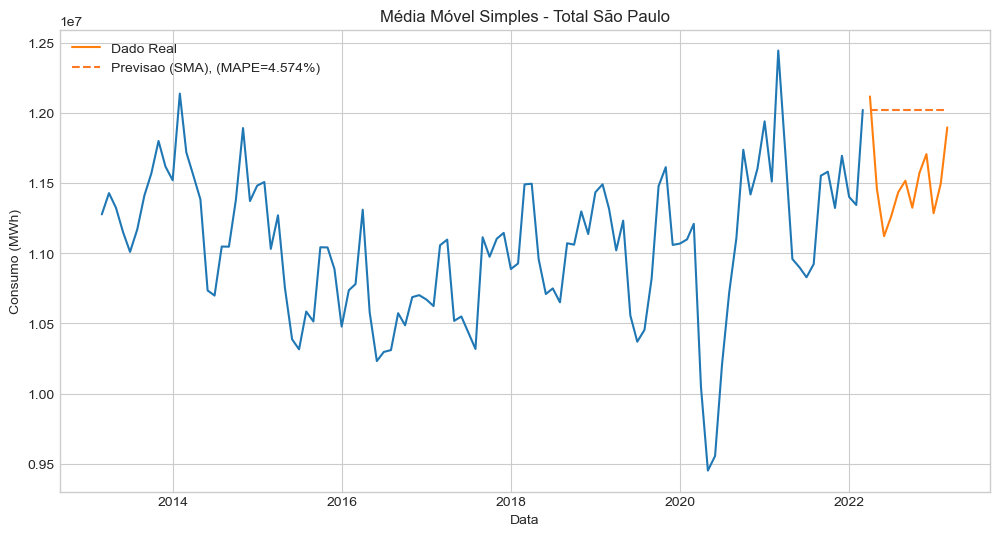

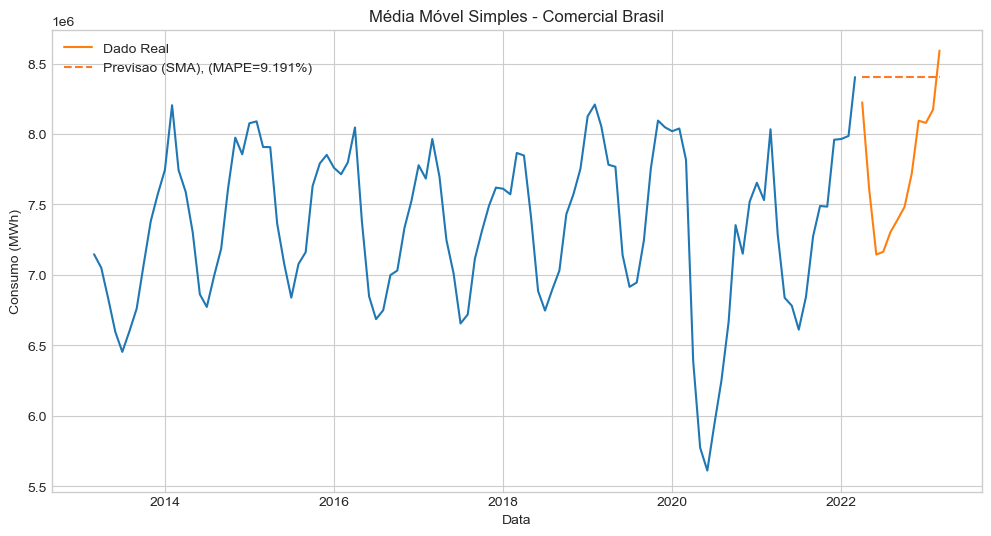

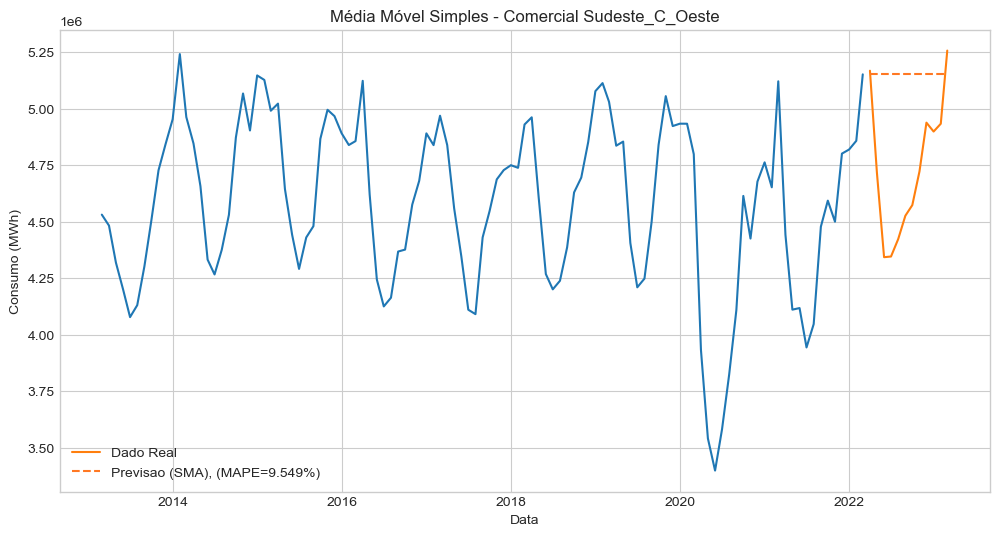

...

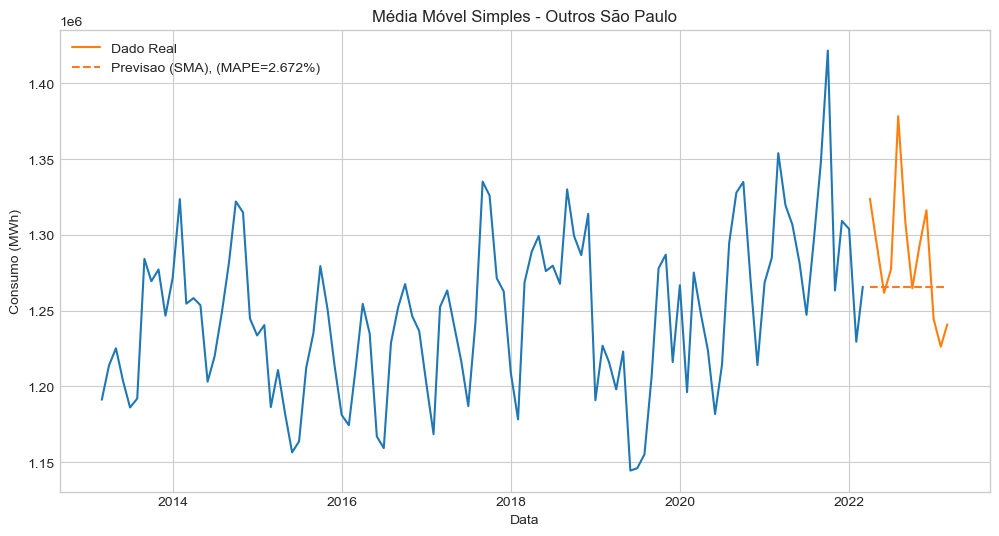

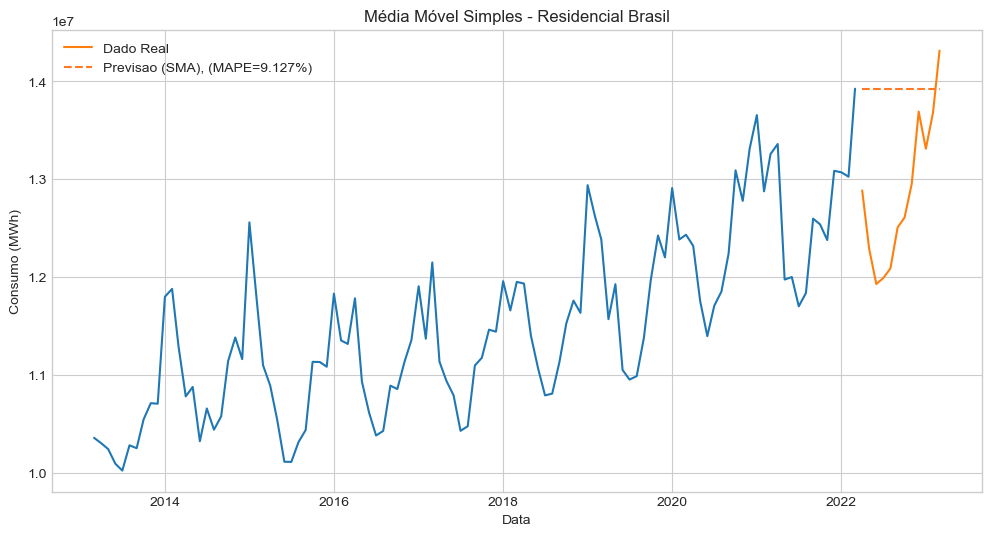

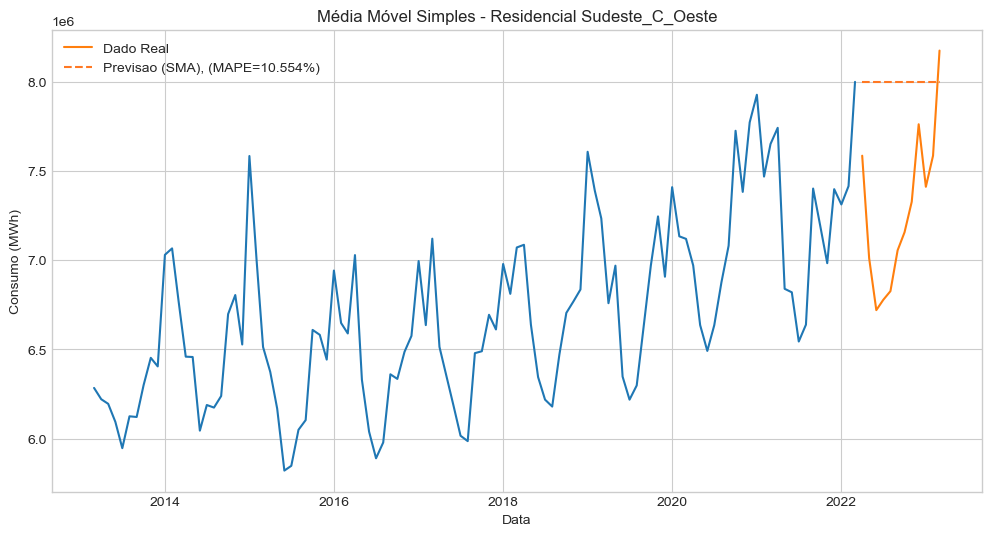

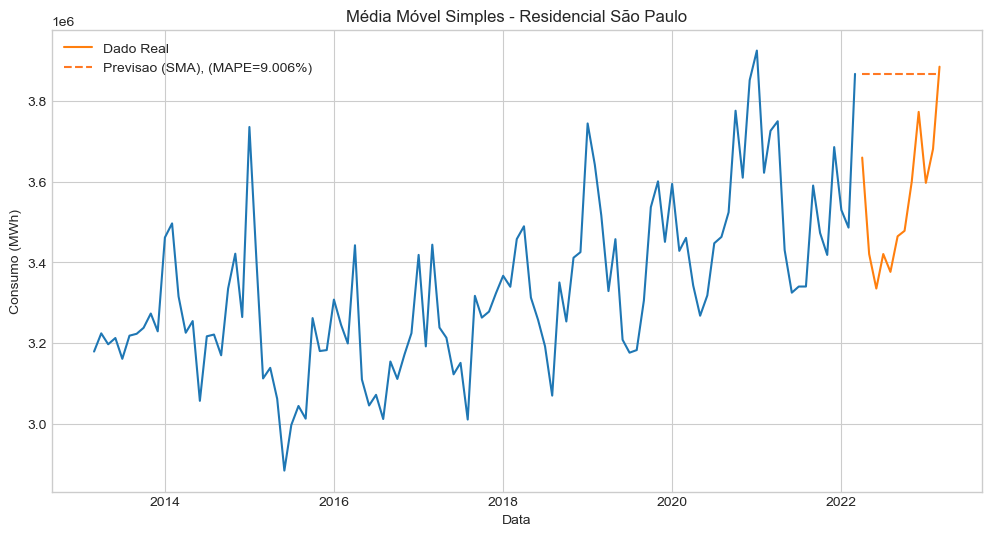

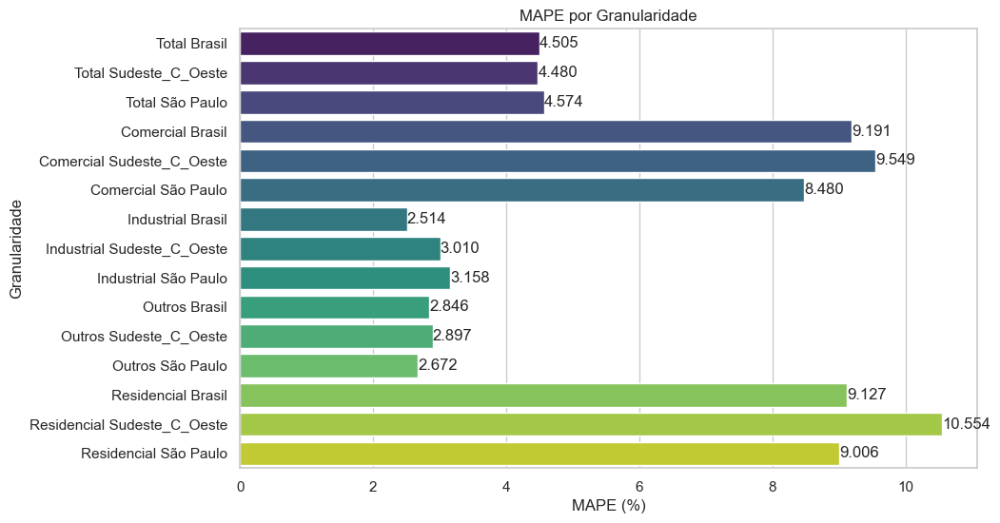

In [65]:
lista_previsoes = []
mape_por_regiao = []
rmse_por_regiao = []
mpe_por_regiao = []

for serie, grupo in zip(series_temporais, lista_regiao):
    train = serie.groupby(['Data_padrao'])['Valor'].sum()
    test = serie.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[110:-12]
    test = test.iloc[-12:]
    
    # Cálculo da Média Móvel Simples (SMA)
    last_value = train.iloc[-1]
    pred = pd.Series([last_value] * 12, index=test.index)
    
    mape = mean_absolute_percentage_error(test, pred)*100
    rmse = mean_squared_error(test, pred, squared=False)
    mpe = mean_percentage_error(test, pred)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (SMA), (MAPE={:0.3f}%)".format(mape));
    ax.legend();
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")
    ax.set_title("Média Móvel Simples - {}".format(grupo))

    # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_SMA': mape})
    rmse_por_regiao.append({'Granularidade': grupo, 'RMSE_SMA': rmse})
    mpe_por_regiao.append({'Granularidade': grupo, 'MPE_SMA': mpe})

    # Restante do código para plotar os resultados
    # ...
    
    plt.savefig('dummy/'+"previsao_dummy_" + grupo + ".png", bbox_inches="tight")

# Criação do DataFrame com os valores de MAPE por região
df_mape = pd.DataFrame(mape_por_regiao)
df_rmse = pd.DataFrame(rmse_por_regiao)
df_mpe = pd.DataFrame(mpe_por_regiao)

df_metricas = pd.merge(df_mape, df_mpe, on='Granularidade').merge(df_rmse, on='Granularidade')

# Ordenar o DataFrame por MAPE
#df_mape = df_mape.sort_values(by='MAPE', ascending=False)

# Configurar estilo Seaborn
sns.set(style="whitegrid")

# Criar o gráfico de barras com cores

plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_SMA', y='Granularidade', data=df_mape, palette="viridis",  ci=None)
plt.xlabel("MAPE (%)")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")
for p in ax.patches:
    ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.3f}', va='center')
plt.savefig('dummy/'+"mape_dummy",bbox_inches="tight")
plt.show()

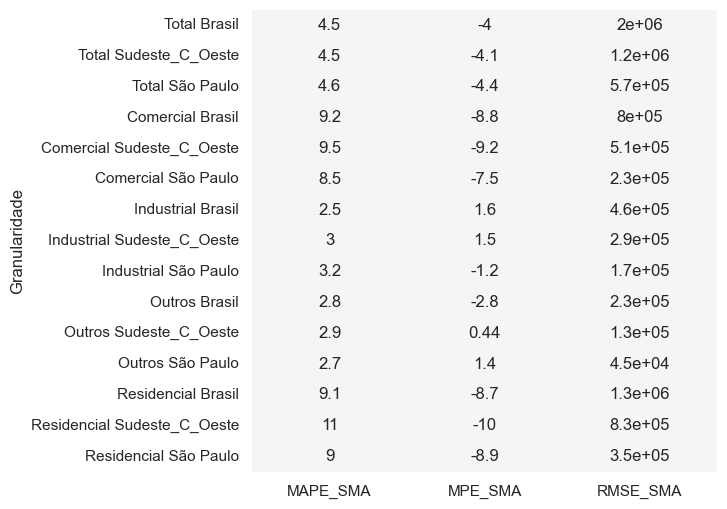

In [66]:
plt.figure(figsize=(6, 6))

cmap = sns.color_palette(["#f5f5f5"])
df_metricas.set_index('Granularidade', inplace=True)
                      
sns.heatmap(df_metricas, annot=True, cmap=cmap, cbar= False)
plt.savefig("dummy/"+"tabela_dummy", bbox_inches="tight")

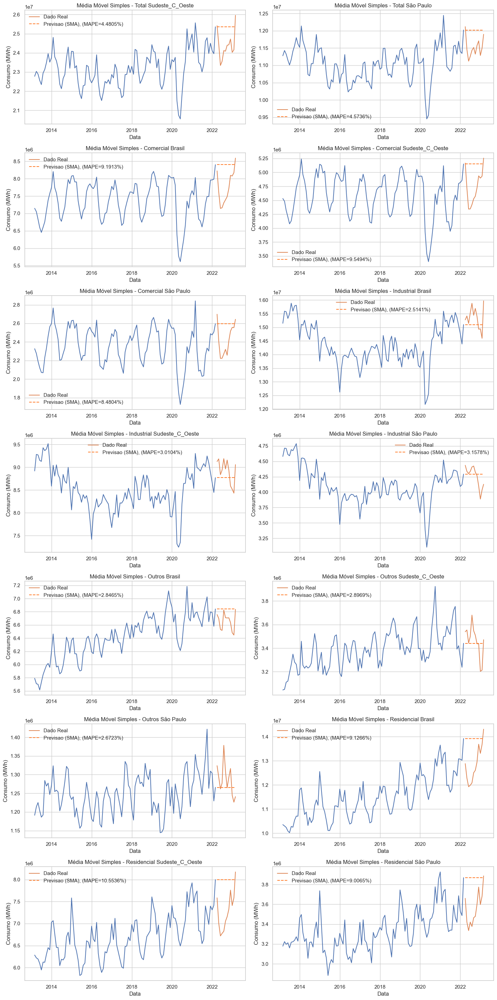

In [67]:
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 30))

for serie, grupo, ax in zip(series_temporais[1:], lista_regiao[1:], axs.flat):
    if i != 0:

        train = serie.groupby(['Data_padrao'])['Valor'].sum()
        test = serie.groupby(['Data_padrao'])['Valor'].sum()
        train = train.iloc[110:-12]
        test = test.iloc[-12:]

        # Cálculo da Média Móvel Simples (SMA)
        last_value = train.iloc[-1]
        pred = pd.Series([last_value] * 12, index=test.index)

        mape = mean_absolute_percentage_error(test, pred)*100

        ax.plot(train)
        ax.plot(test, label='Dado Real')
        ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (SMA), (MAPE={:0.4f}%)".format(mape))
        ax.legend()
        ax.set_ylabel("Consumo (MWh)")
        ax.set_xlabel("Data")
        ax.set_title("Média Móvel Simples - {}".format(grupo))

# Ajusta o layout para evitar sobreposição de rótulos
plt.tight_layout()
# Salva a figura
plt.savefig('dummy/' + "previsao_dummy_todas.png", bbox_inches="tight")
plt.show()

## HOLT WINTERS

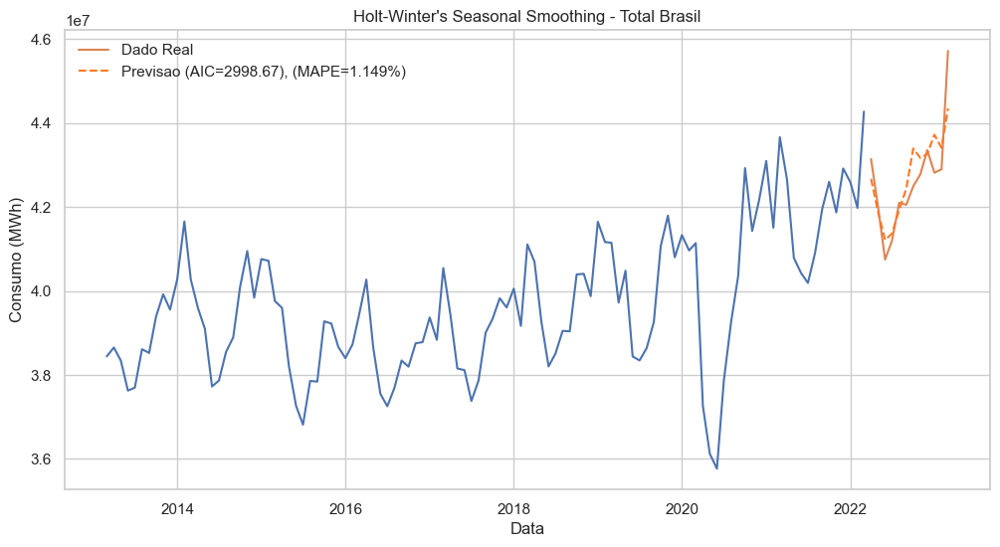

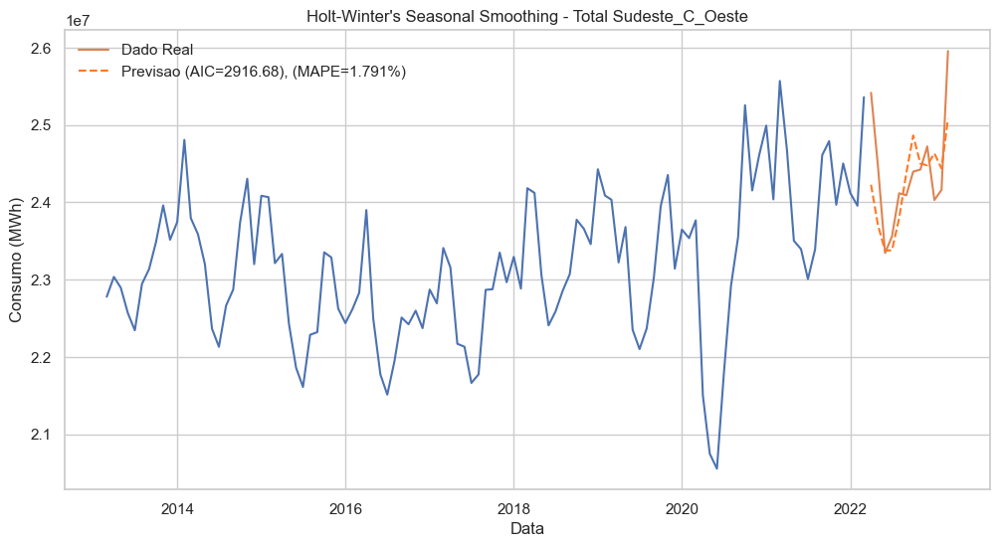

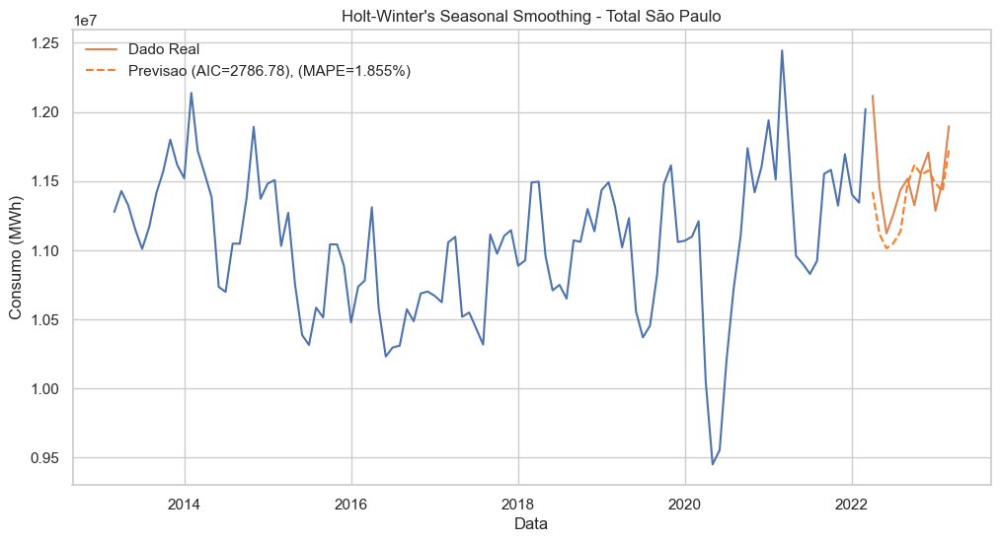

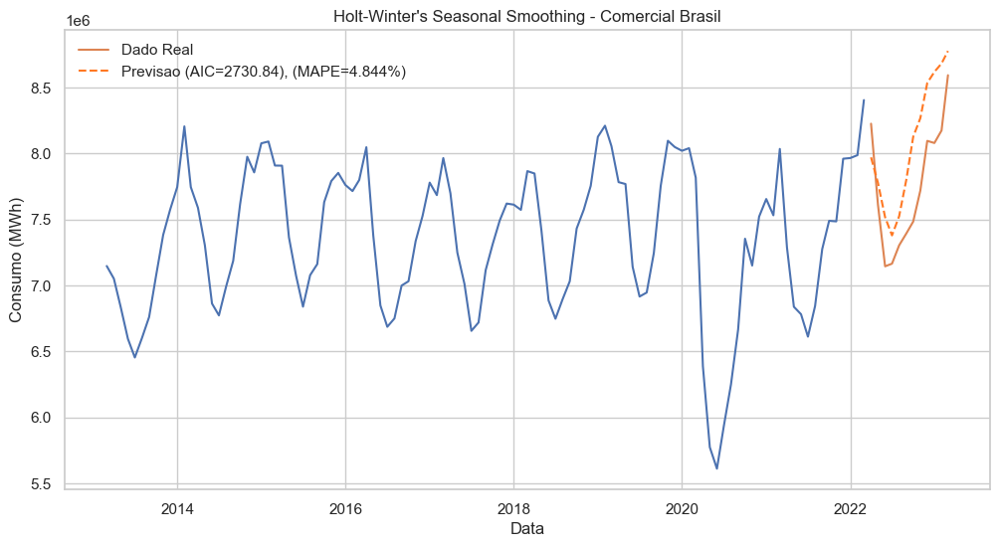

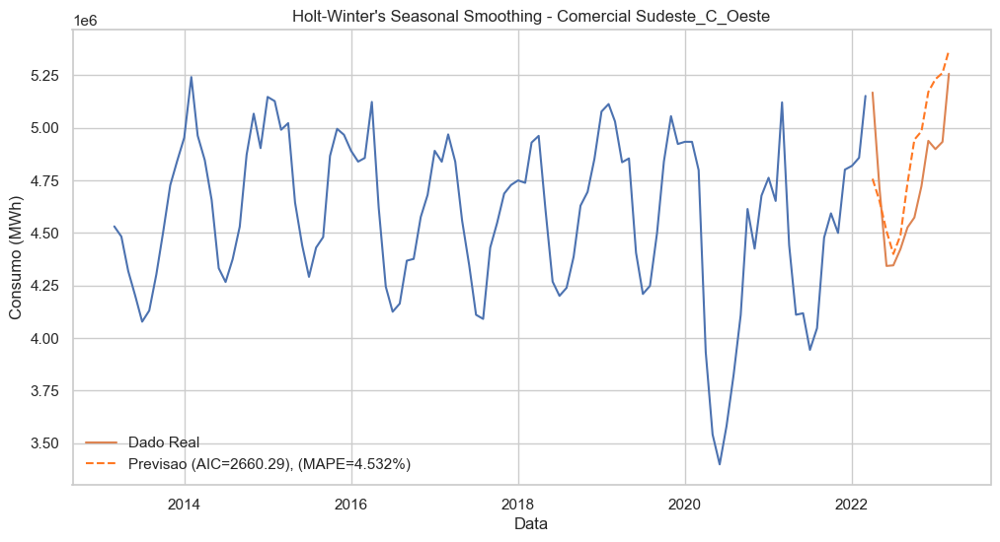

...

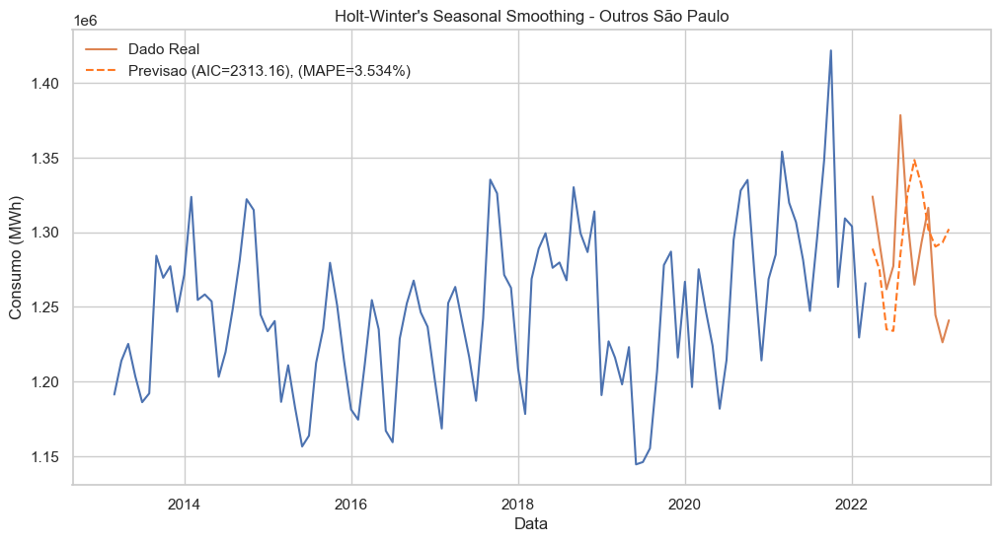

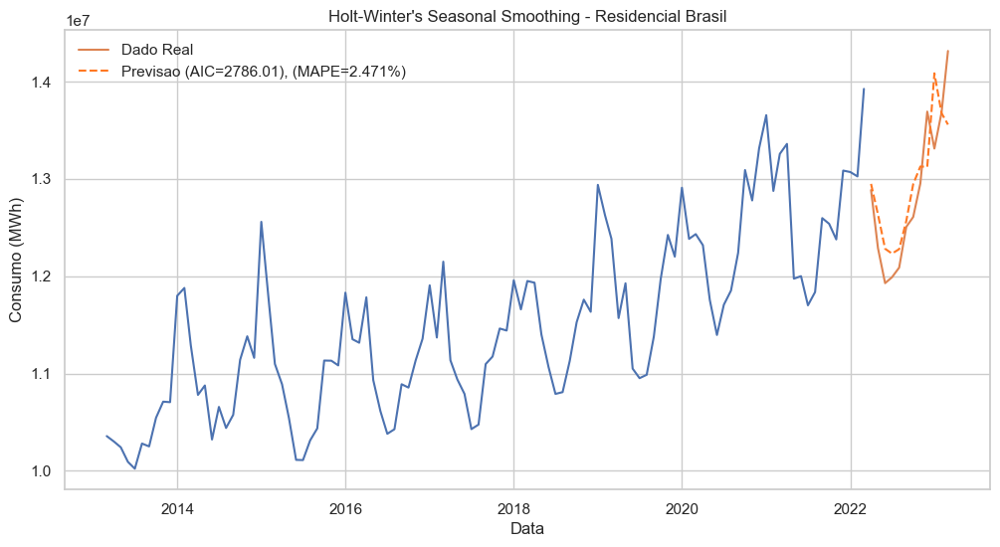

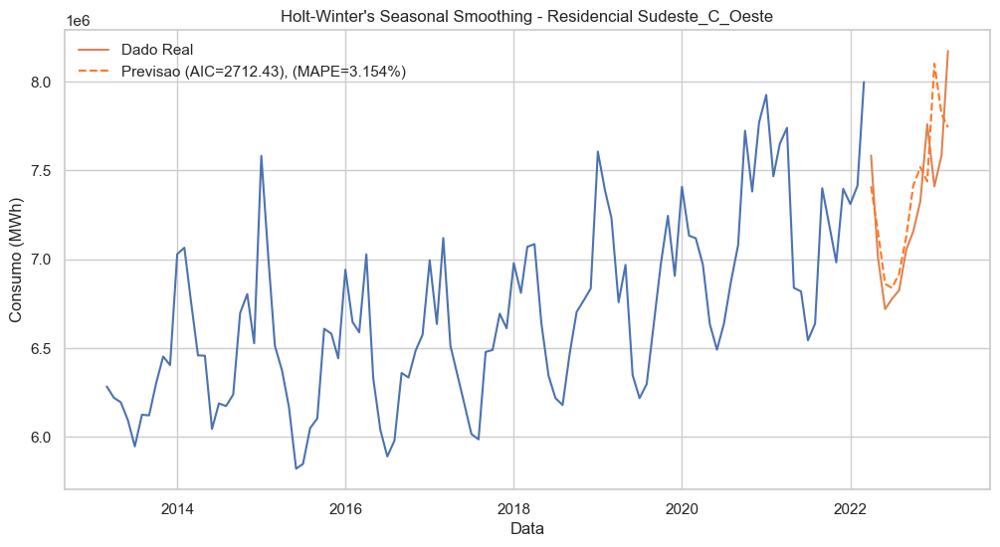

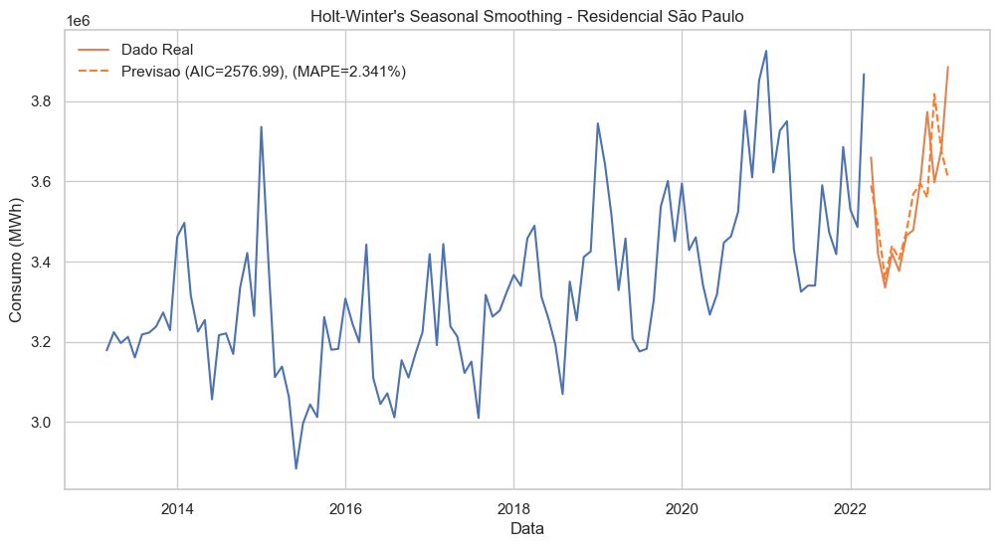

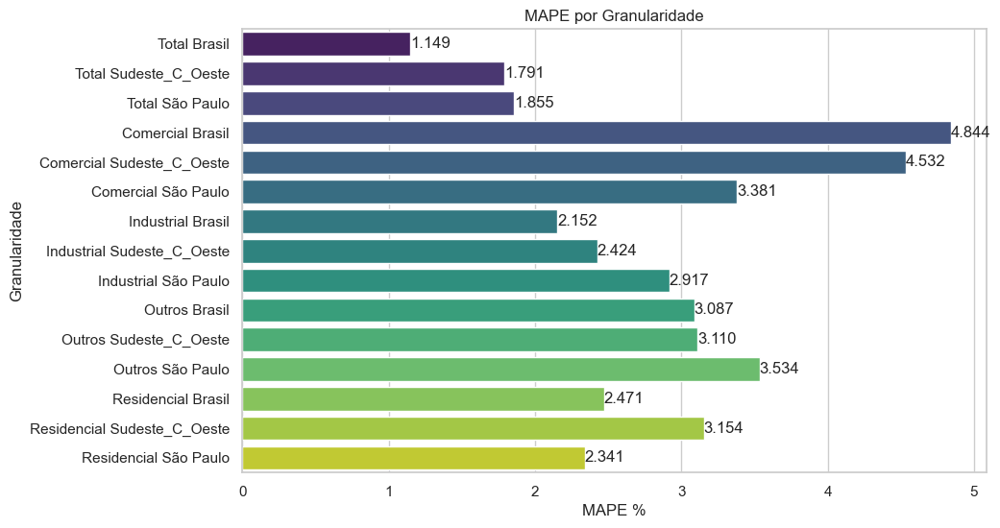

In [68]:
lista_previsoes = []
mape_por_regiao = []
rmse_por_regiao = []
mpe_por_regiao = []
aic_results = []

for serie, grupo in zip(series_temporais, lista_regiao):
    train = serie.groupby(['Data_padrao'])['Valor'].sum()
    test = serie.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[110:-12]
    test = test.iloc[-12:]
    
    # Cálculo do Holt Winters
    model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=12)
    fit = model.fit()
    pred = fit.forecast(12)
    
    mape = mean_absolute_percentage_error(test, pred) *100
    rmse = mean_squared_error(test, pred, squared=False)
    mpe = mean_percentage_error(test, pred)
    aic = fit.aic
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (AIC={:0.2f}), (MAPE={:0.3f}%)".format(fit.aic, mape));
    ax.legend();
    ax.set_title("Holt-Winter's Seasonal Smoothing - {}".format( grupo ));
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")

    # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_HW': mape})
    rmse_por_regiao.append({'Granularidade': grupo, 'RMSE_HW': rmse})
    mpe_por_regiao.append({'Granularidade': grupo, 'MPE_HW': mpe})
    aic_results = np.append(aic_results, aic)

    # Restante do código para plotar os resultados
    # ...
    
    plt.savefig('hw/'+"previsao_hw_" + grupo + ".png", bbox_inches="tight")

# Criação do DataFrame com os valores de MAPE por região
df_mape = pd.DataFrame(mape_por_regiao)
df_rmse = pd.DataFrame(rmse_por_regiao)
df_mpe = pd.DataFrame(mpe_por_regiao)
df_aic = pd.DataFrame(aic_results)

df_metricas1 = pd.merge(df_mape, df_mpe, on='Granularidade').merge(df_rmse, on='Granularidade')
df_metricas1 = pd.concat([df_metricas1, df_aic], axis=1)

df_metricas1 = df_metricas1.rename(columns={0:'AIC_HW'})

# Ordenar o DataFrame por MAPE
#df_mape = df_mape.sort_values(by='MAPE', ascending=False)

# Configurar estilo Seaborn
sns.set(style="whitegrid")

# Criar o gráfico de barras com cores
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_HW', y='Granularidade', data=df_mape, palette="viridis",  ci=None)
plt.xlabel("MAPE %")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")
for p in ax.patches:
    ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.3f}', va='center')
plt.savefig('hw/'+"mape_hw", bbox_inches="tight")
plt.show()

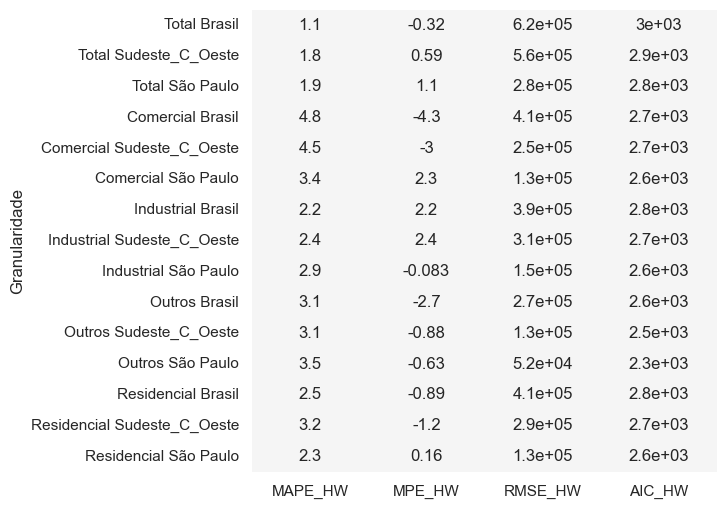

In [69]:
plt.figure(figsize=(6, 6))

cmap = sns.color_palette(["#f5f5f5"])
df_metricas1.set_index('Granularidade', inplace=True)
                      
sns.heatmap(df_metricas1, annot=True, cmap=cmap, cbar= False)
plt.savefig("hw/"+"tabela_hw", bbox_inches="tight")

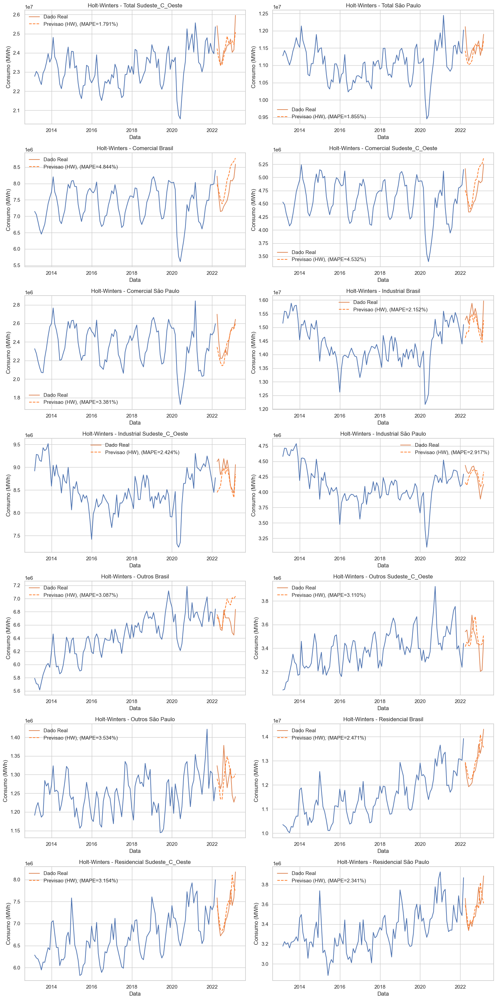

In [70]:
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 30))

for serie, grupo, ax in zip(series_temporais[1:], lista_regiao[1:], axs.flat):
    if i != 0:

        train = serie.groupby(['Data_padrao'])['Valor'].sum()
        test = serie.groupby(['Data_padrao'])['Valor'].sum()
        train = train.iloc[110:-12]
        test = test.iloc[-12:]

        # Cálculo da Média Móvel Simples (SMA)
        model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=12)
        fit = model.fit()
        pred = fit.forecast(12)
        
        mape = mean_absolute_percentage_error(test, pred)*100

        ax.plot(train)
        ax.plot(test, label='Dado Real')
        ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (HW), (MAPE={:0.3f}%)".format(mape))
        ax.legend()
        ax.set_ylabel("Consumo (MWh)")
        ax.set_xlabel("Data")
        ax.set_title("Holt-Winters - {}".format(grupo))

# Ajusta o layout para evitar sobreposição de rótulos
plt.tight_layout()
# Salva a figura
plt.savefig('hw/' + "previsao_hw_todas.png", bbox_inches="tight")
plt.show()

## Auto SARIMA

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=2932.414, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2933.736, Time=0.08 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2933.571, Time=0.12 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=2932.249, Time=0.04 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=2927.569, Time=0.09 sec
 ARIMA(0,1,0)(3,1,0)[12]             : AIC=2925.109, Time=0.21 sec
 ARIMA(0,1,0)(4,1,0)[12]             : AIC=2923.710, Time=0.43 sec
 ARIMA(0,1,0)(5,1,0)[12]             : AIC=2926.575, Time=0.99 sec
 ARIMA(0,1,0)(4,1,1)[12]             : AIC=2924.913, Time=1.29 sec
 ARIMA(0,1,0)(3,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(5,1,1)[12]             : AIC=2927.509, Time=2.26 sec
 ARIMA(1,1,0)(4,1,0)[12]             : AIC=2926.255, Time=0.47 sec
 ARIMA(0,1,1)(4,1,0)[12]             : AIC=2926.646, Time=0.49 sec
 ARIMA(1,1,1)(4,1,0)[12]             : AIC=2928.641, Time=0.56 sec
 ARIMA(0,1,0)(4,1,0)[12]

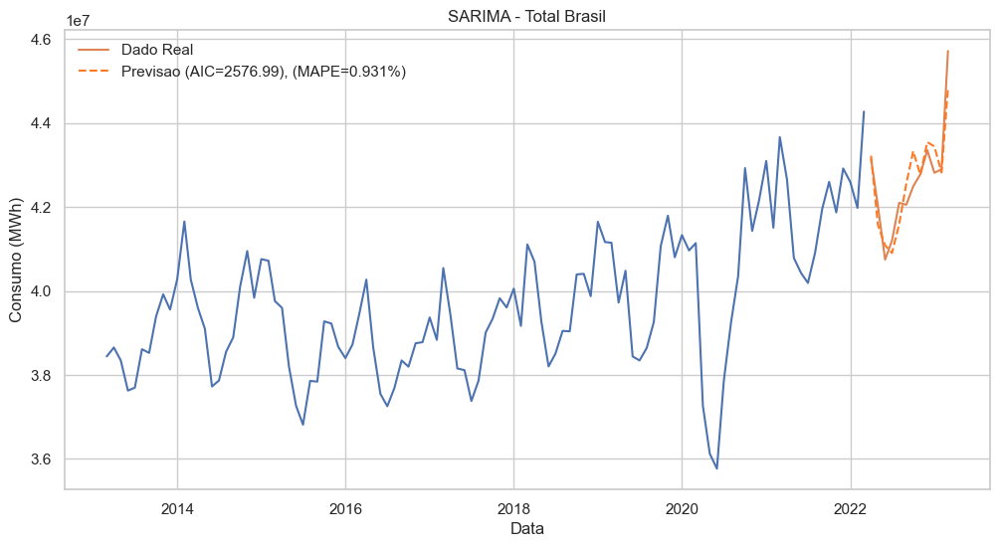

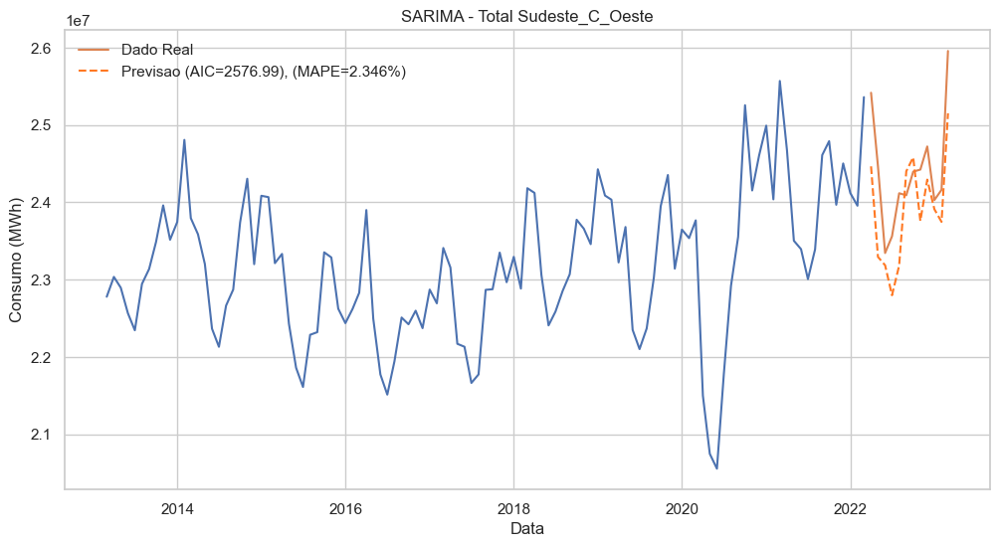

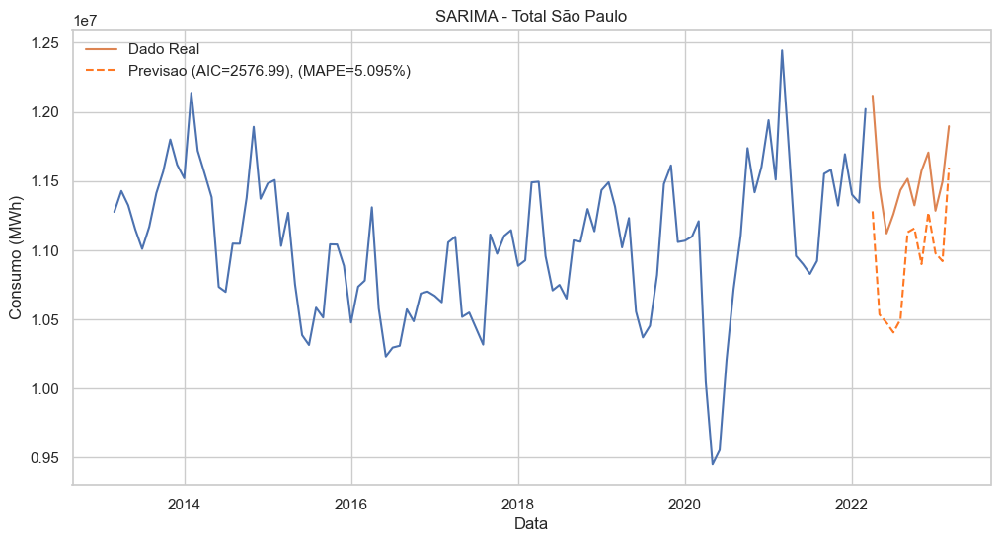

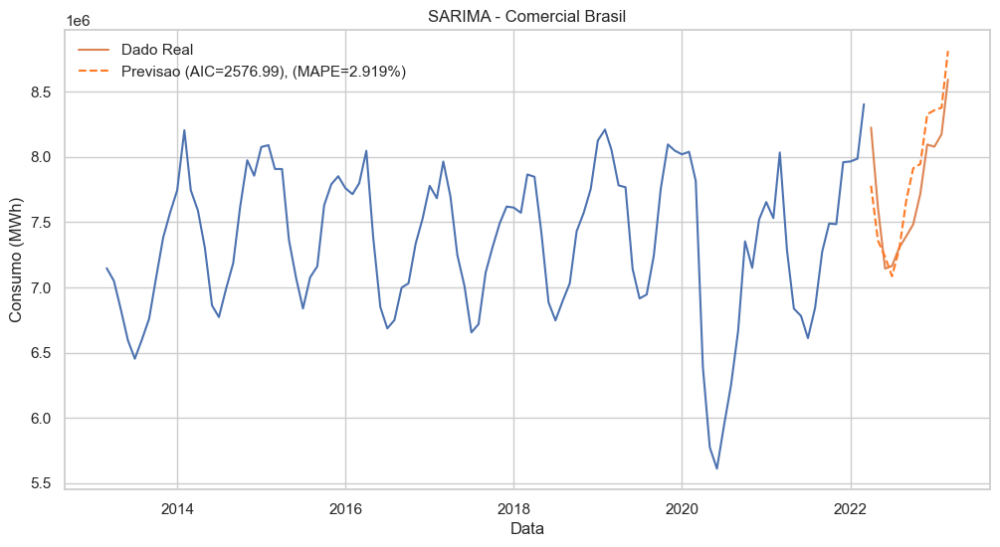

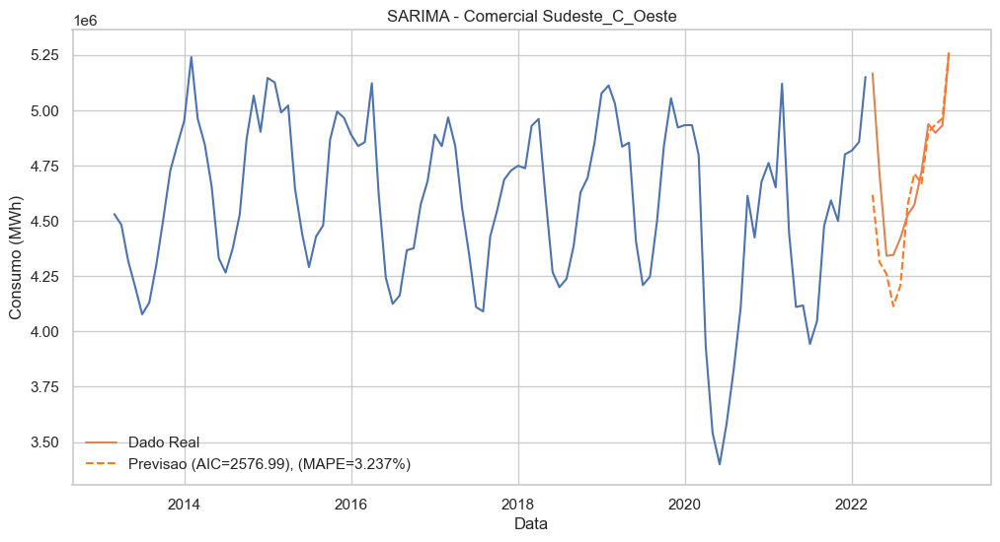

...

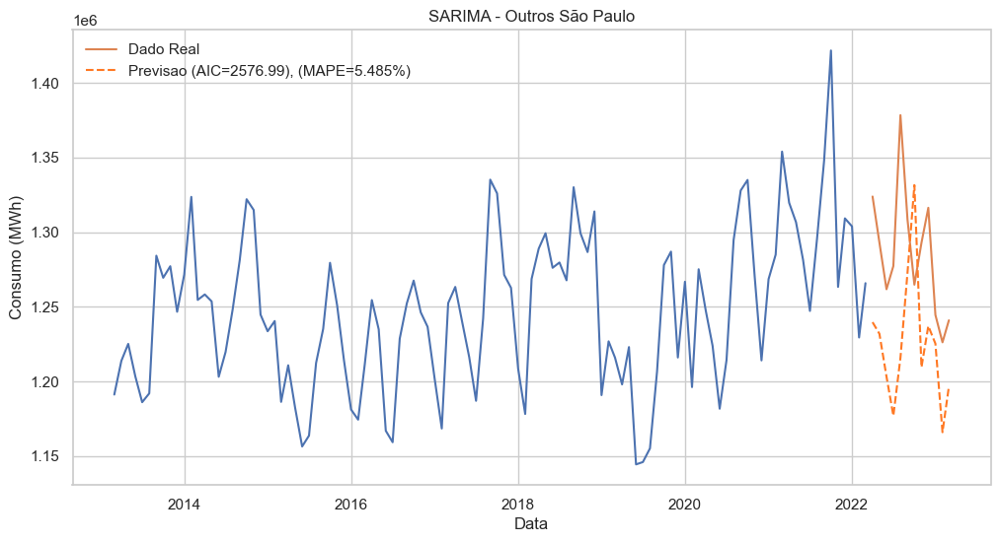

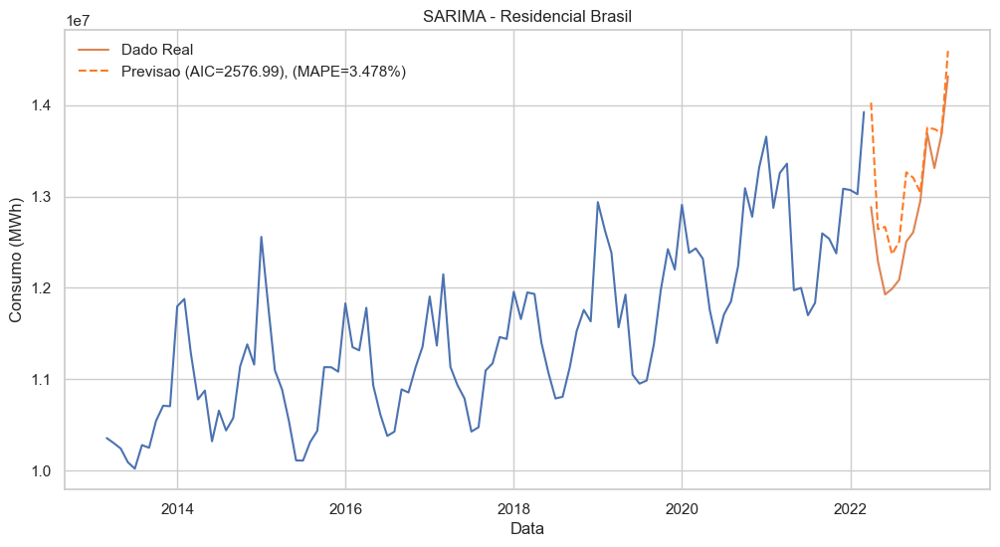

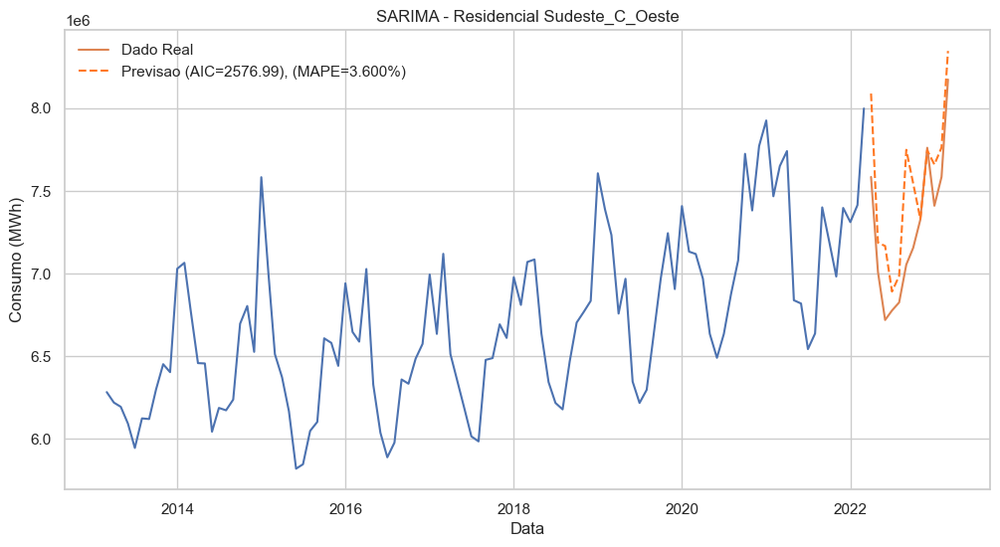

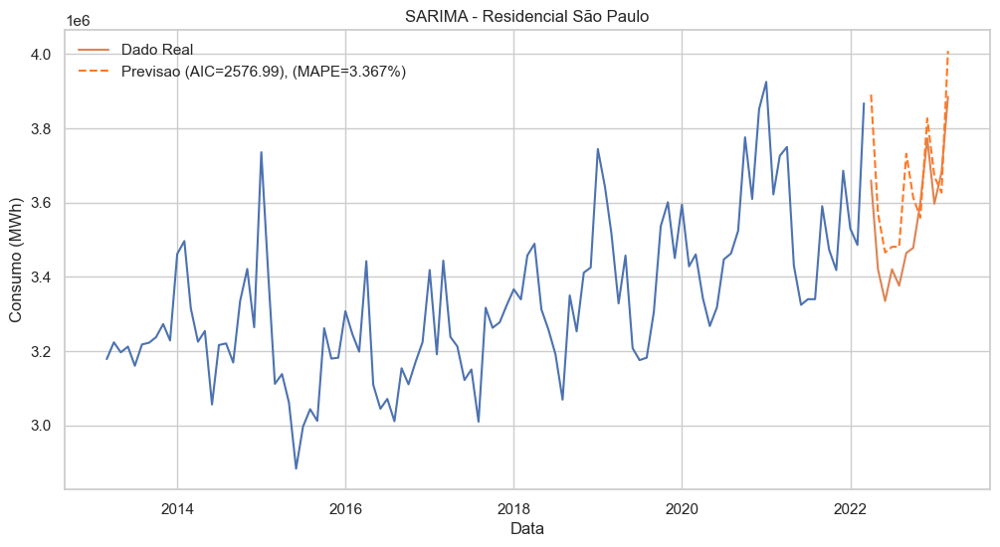

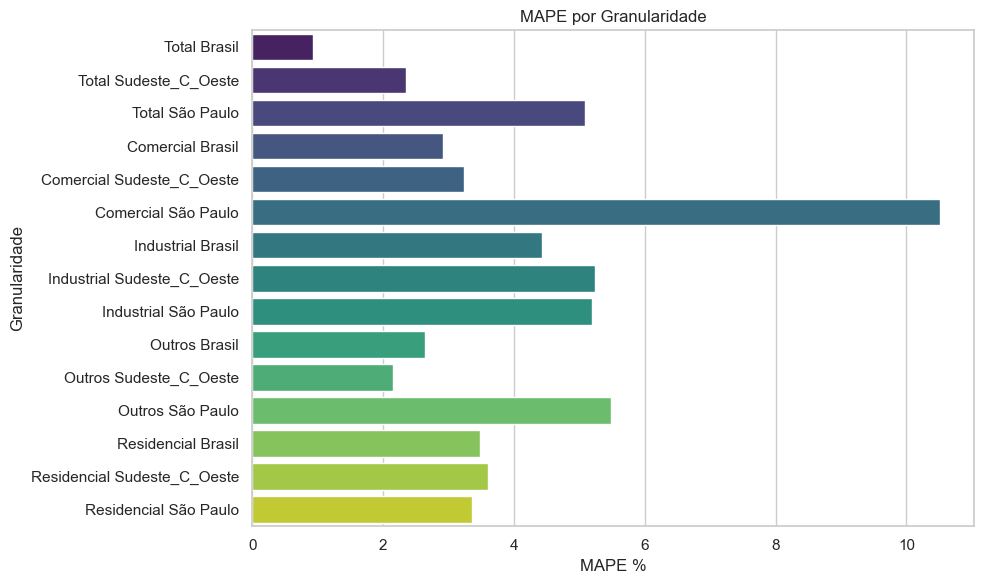

In [71]:
lista_previsoes = []
mape_por_regiao = []
rmse_por_regiao = []
mpe_por_regiao = []
aic_results = []

for serie, grupo in zip(series_temporais, lista_regiao):
    train = serie.groupby(['Data_padrao'])['Valor'].sum()
    test = serie.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[110:-12]
    test = test.iloc[-12:]
    
    # Cálculo do Holt Winters
    model = pm.auto_arima(train, start_p=0, d=1, start_q=0,
    max_p=5, max_d=5, max_q=5,
    start_P=0, D=1, start_Q=0, max_P=5, max_D=5,
    max_Q=5, m=12, seasonal=True,
    stationary=False,
    error_action='warn', trace=True,
    suppress_warnings=True, stepwise=True,
    random_state=20, n_fits=50)
    pred = model.predict(n_periods = 12)
    
    mape = mean_absolute_percentage_error(test, pred) *100
    rmse = mean_squared_error(test, pred,  squared=False)
    mpe = mean_percentage_error(test, pred)
    aic = fit.aic
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (AIC={:0.2f}), (MAPE={:0.3f}%)".format(fit.aic, mape));
    ax.legend();
    ax.set_title("SARIMA - {}".format(grupo));
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")

    # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_SARIMA': mape})
    rmse_por_regiao.append({'Granularidade': grupo, 'RMSE_SARIMA': rmse})
    mpe_por_regiao.append({'Granularidade': grupo, 'MPE_SARIMA': mpe})
    aic_results = np.append(aic_results, aic)

    # Restante do código para plotar os resultados
    # ...
    
    plt.savefig('sarima/'+"previsao_sarima_" + grupo + ".png", bbox_inches="tight")

# Criação do DataFrame com os valores de MAPE por região
df_mape = pd.DataFrame(mape_por_regiao)
df_rmse = pd.DataFrame(rmse_por_regiao)
df_mpe = pd.DataFrame(mpe_por_regiao)
df_aic = pd.DataFrame(aic_results)

df_metricas2 = pd.merge(df_mape, df_mpe, on='Granularidade').merge(df_rmse, on='Granularidade')
df_metricas2 = pd.concat([df_metricas2, df_aic], axis=1)

df_metricas2 = df_metricas2.rename(columns={0:'AIC_SARIMA'})

# Ordenar o DataFrame por MAPE
#df_mape = df_mape.sort_values(by='MAPE', ascending=False)

# Configurar estilo Seaborn
sns.set(style="whitegrid")

# Criar o gráfico de barras com cores
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_SARIMA', y='Granularidade', data=df_mape, palette="viridis",  ci=None)
plt.xlabel("MAPE %")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")

plt.tight_layout()
plt.savefig('sarima/'+"mape_SARIMA", bbox_inches="tight")
plt.show()

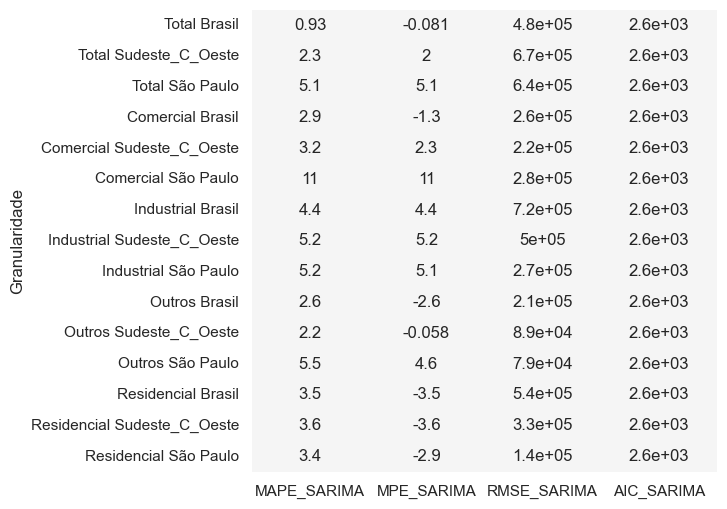

In [72]:
plt.figure(figsize=(6, 6))

cmap = sns.color_palette(["#f5f5f5"])
df_metricas2.set_index('Granularidade', inplace=True)
                      
sns.heatmap(df_metricas2, annot=True, cmap=cmap, cbar= False)
plt.savefig("sarima/"+"tabela_sarima", bbox_inches="tight")

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=2862.824, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2864.521, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2864.268, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=2862.909, Time=0.04 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=2863.343, Time=0.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=2864.014, Time=0.02 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=2863.999, Time=0.02 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=2865.999, Time=0.06 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=2863.986, Time=0.01 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.483 seconds
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=2742.619, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2745.141, Time=0.06 sec
 ARIMA(0,1,1)(0,1,1)[12]             

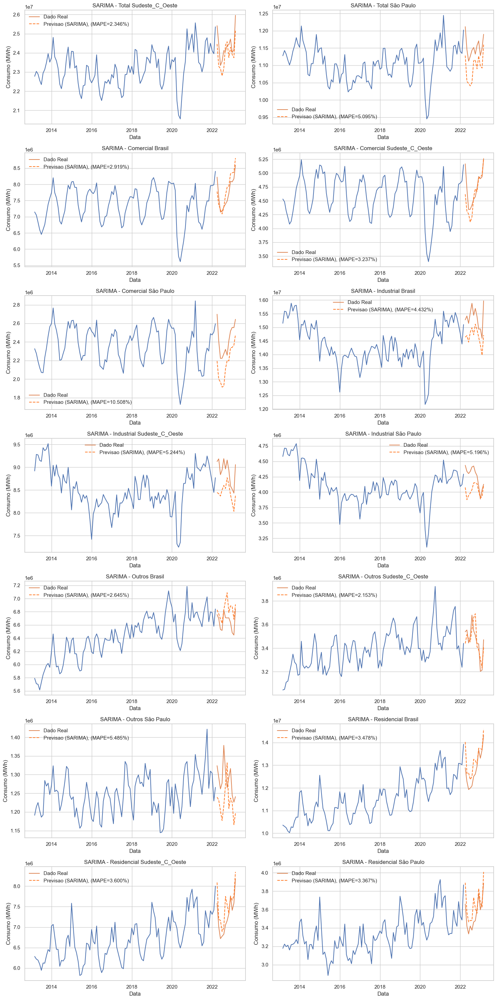

In [73]:
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 30))

for serie, grupo, ax in zip(series_temporais[1:], lista_regiao[1:], axs.flat):
    if i != 0:

        train = serie.groupby(['Data_padrao'])['Valor'].sum()
        test = serie.groupby(['Data_padrao'])['Valor'].sum()
        train = train.iloc[110:-12]
        test = test.iloc[-12:]

        # Cálculo do SARIMA
        model = pm.auto_arima(train, start_p=0, d=1, start_q=0,
        max_p=5, max_d=5, max_q=5,
        start_P=0, D=1, start_Q=0, max_P=5, max_D=5,
        max_Q=5, m=12, seasonal=True,
        stationary=False,
        error_action='warn', trace=True,
        suppress_warnings=True, stepwise=True,
        random_state=20, n_fits=50)
        
        pred = model.predict(n_periods = 12)
        
        mape = mean_absolute_percentage_error(test, pred)*100

        ax.plot(train)
        ax.plot(test, label='Dado Real')
        ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (SARIMA), (MAPE={:0.3f}%)".format(mape))
        ax.legend()
        ax.set_ylabel("Consumo (MWh)")
        ax.set_xlabel("Data")
        ax.set_title("SARIMA - {}".format(grupo))

# Ajusta o layout para evitar sobreposição de rótulos
plt.tight_layout()
# Salva a figura
plt.savefig('sarima/' + "previsao_sarima_todas.png", bbox_inches="tight")
plt.show()

## Auto SARIMAX

In [74]:
## pib
df_pib = pd.read_csv('PIB.csv', sep=';', encoding='latin1')
df_pib = df_pib.rename(columns={'ï»¿Data': "Data_padrao", 'Valor': "PIB"}, errors="raise")
df_pib['Data_padrao'] = pd.to_datetime(df_pib['Data_padrao'], format='%Y/%m')

df_pib

,Data_padrao,PIB
0,2004-01-01,1445586000
1,2004-02-01,1428613000
2,2004-03-01,1573635000
3,2004-04-01,1569539000
4,2004-05-01,1594989000
...,...,...
226,2022-11-01,8595577000
227,2022-12-01,8683427000
228,2023-01-01,8058721000
229,2023-02-01,8255277000


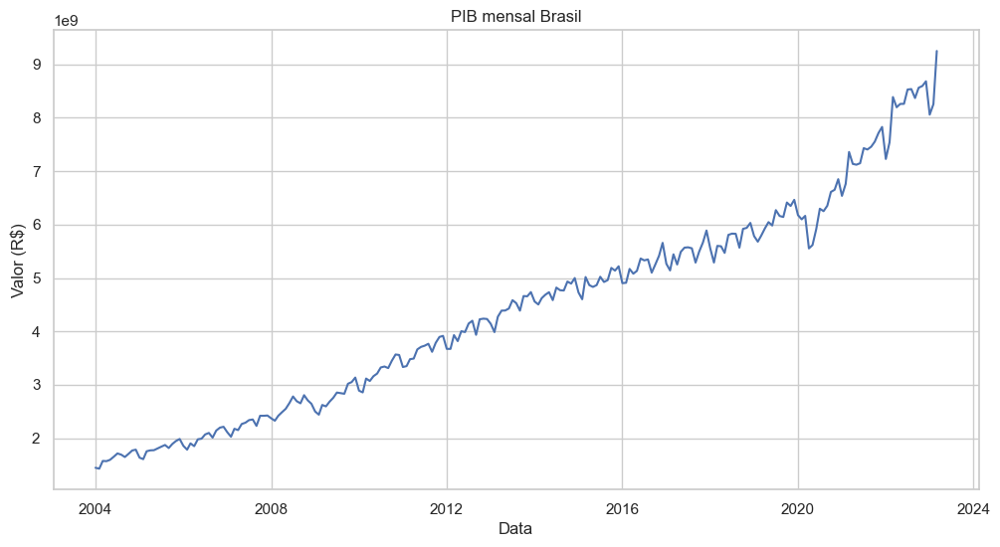

In [75]:
df_pib2 = df_pib.set_index('Data_padrao', inplace=True)

fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(df_pib, label='Dado Real');
ax.set_title("PIB mensal Brasil");
ax.set_ylabel("Valor (R$)")
ax.set_xlabel("Data")
plt.savefig("pib_brasil", bbox_inches="tight")

In [76]:
nobs = len(df_pib)
k = len(df_pib.columns)

# Preencher o array exog com os valores do DataFrame df_exog
exog = np.empty([nobs, 1])
exog[:, :] = df_pib[['PIB']].values

train_exog = exog[110:-12, :]
test_exog = exog[-12:, :]

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=3036.499, Time=0.17 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=3018.584, Time=0.02 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=3037.250, Time=0.11 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=3012.680, Time=0.10 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=3023.700, Time=0.01 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=3011.369, Time=0.03 sec
 ARIMA(0,0,1)(1,1,0)[12] intercept   : AIC=3012.752, Time=0.08 sec
 ARIMA(0,0,1)(1,1,1)[12] intercept   : AIC=3015.130, Time=0.30 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=3035.418, Time=0.06 sec
 ARIMA(0,0,2)(0,1,0)[12] intercept   : AIC=3016.585, Time=0.05 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=3035.710, Time=0.03 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   : AIC=3031.470, Time=0.12 sec
 ARIMA(0,0,1)(0,1,0)[12]             : AIC=3013.641, Time=0.04 sec

Best model:  ARIMA(0,0,1)(0,1,0)[12] intercept
Total fit time: 1.156 seconds
Performi

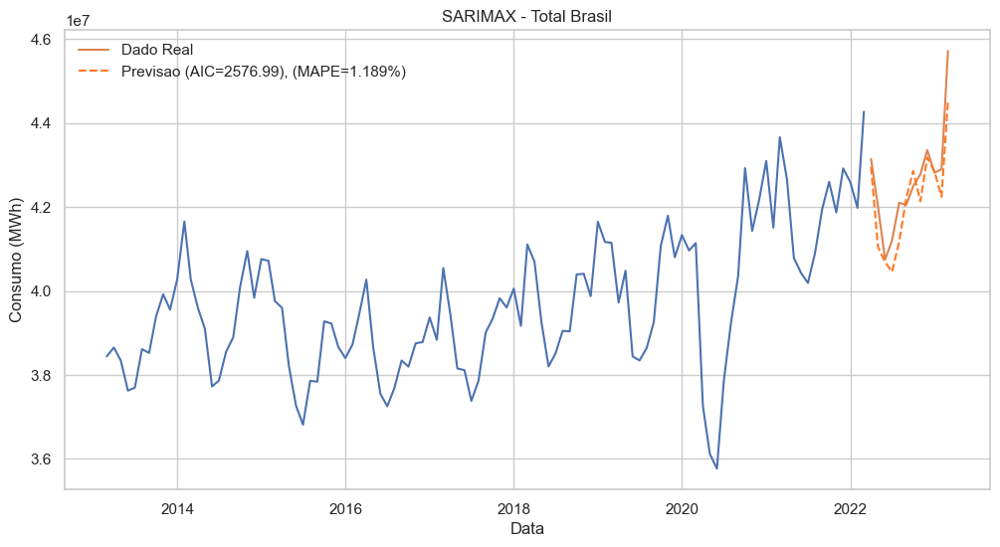

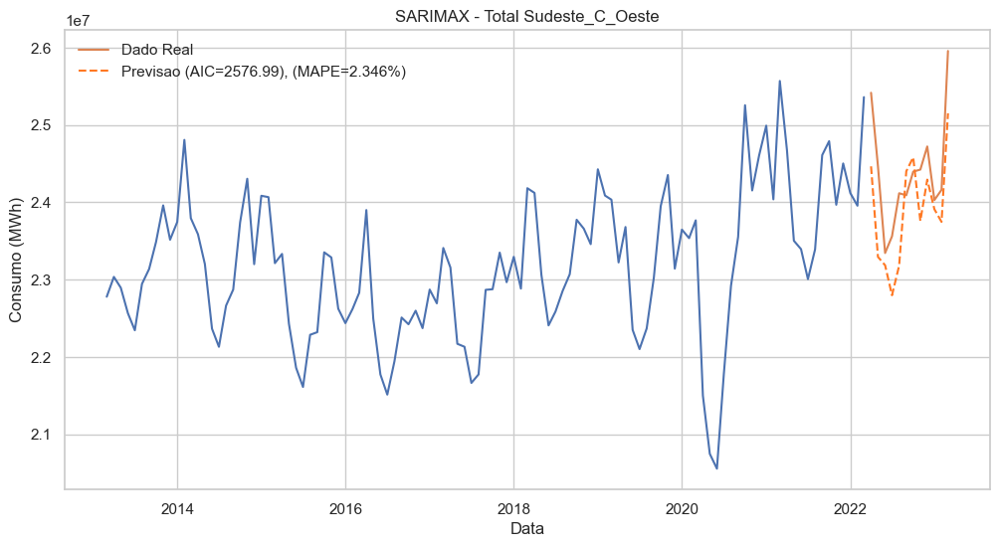

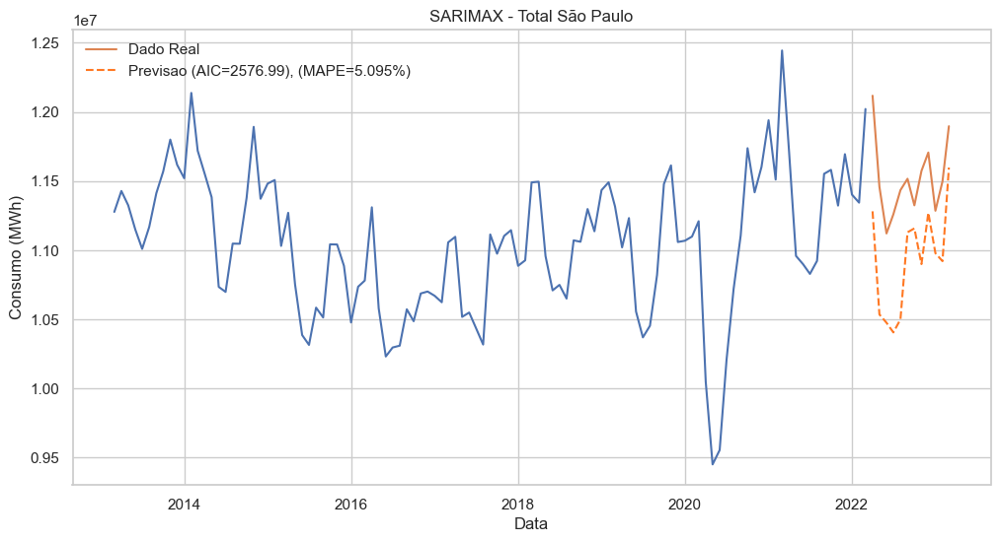

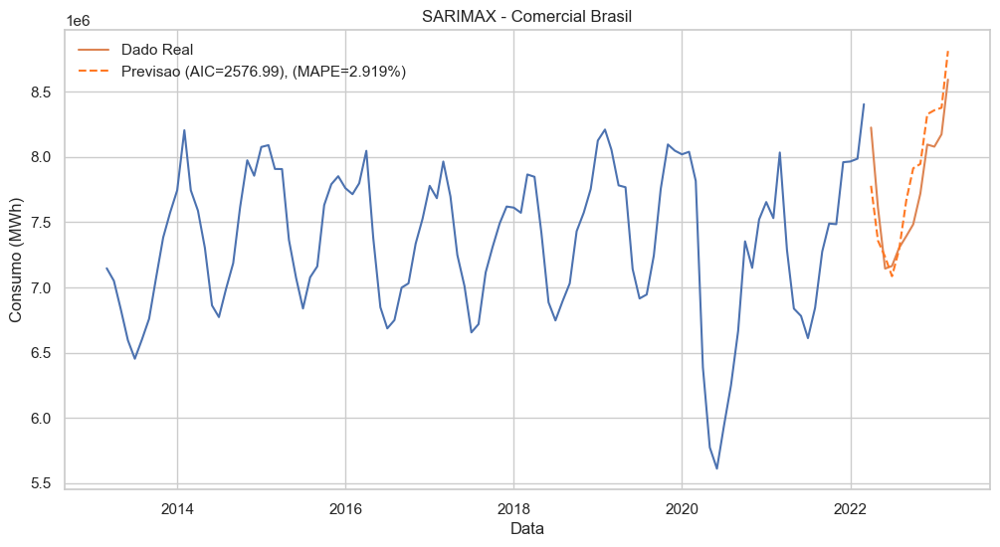

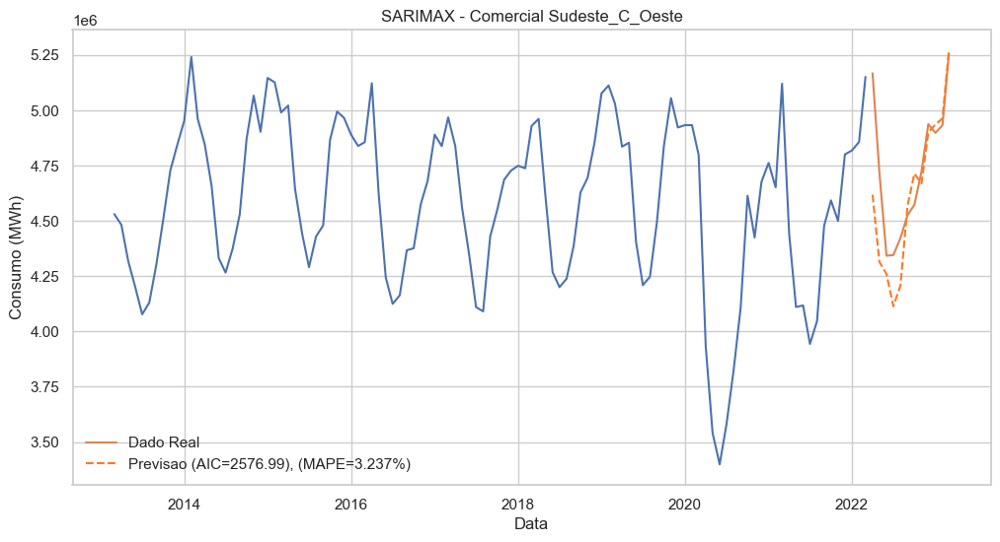

...

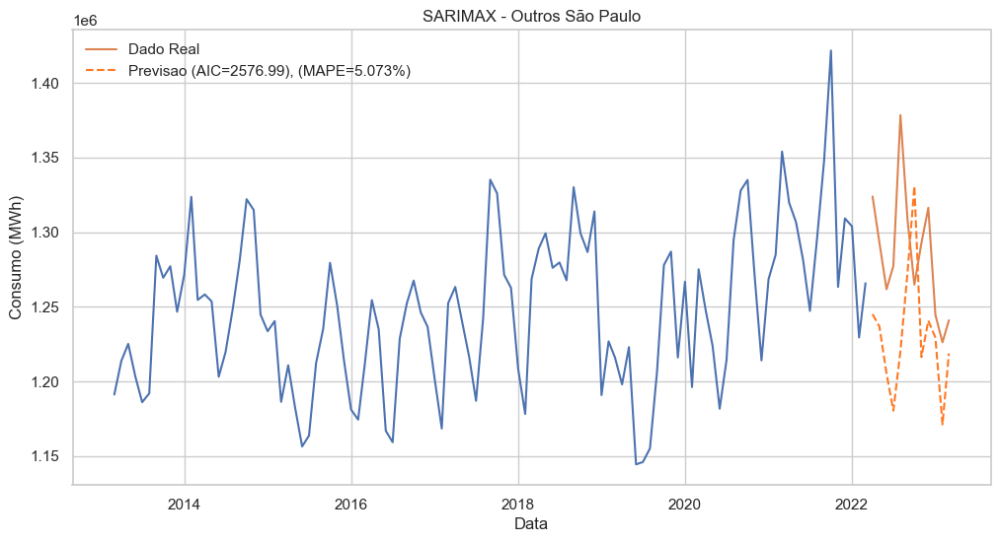

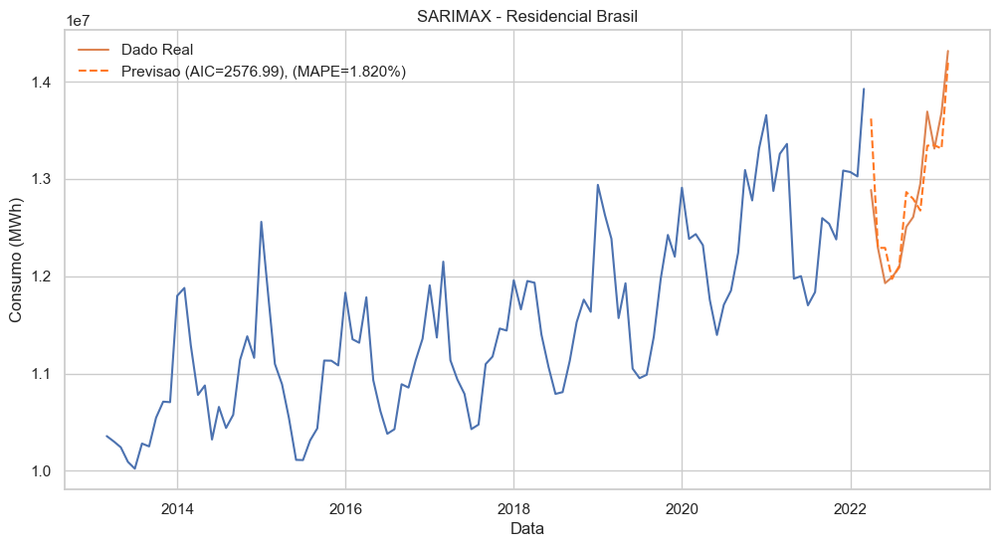

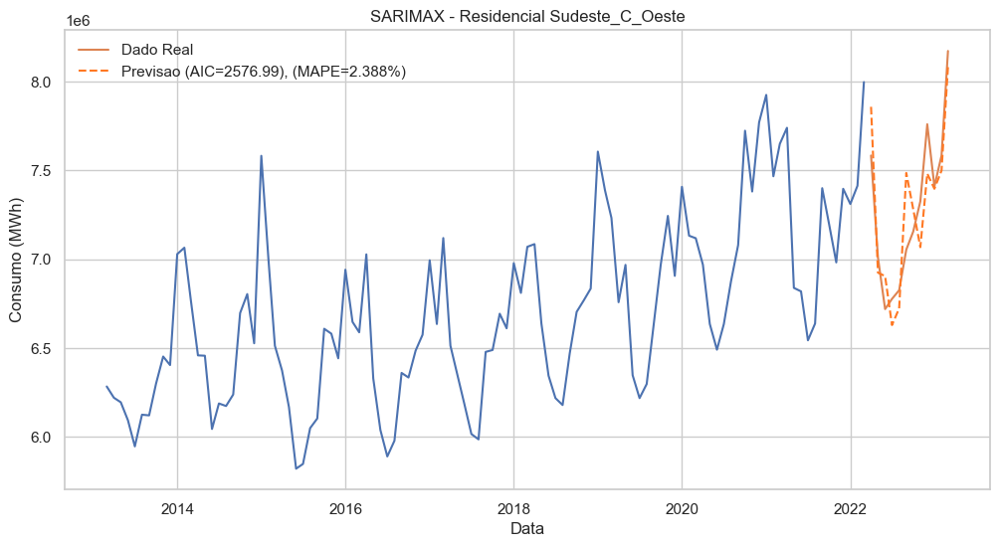

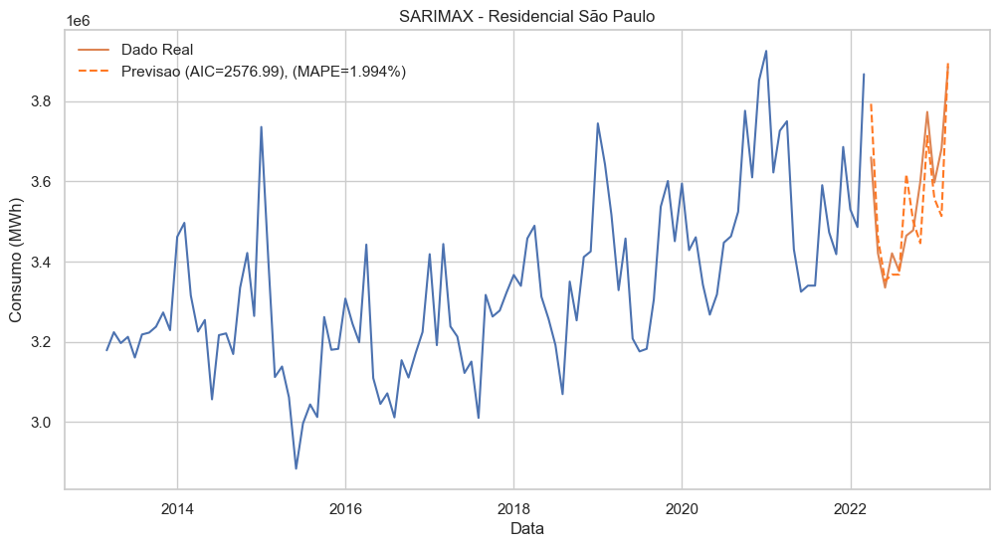

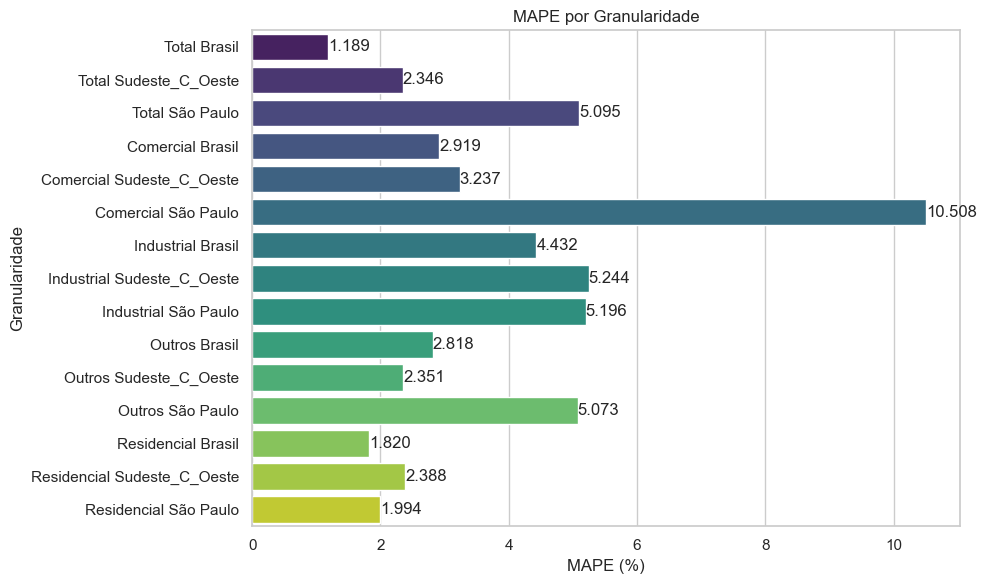

In [77]:
lista_previsoes = []
mape_por_regiao = []
rmse_por_regiao = []
mpe_por_regiao = []
aic_results = []

for serie, grupo in zip(series_temporais, lista_regiao):
    train = serie.groupby(['Data_padrao'])['Valor'].sum()
    test = serie.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[110:-12]
    test = test.iloc[-12:]
    
    # Cálculo do Holt Winters
    SARIMAX_model = pm.auto_arima(train, exogenous=train_exog,
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=5, max_q=5, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, 
                           trace=True,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
    
    #print(model.summary())

    fitted, confint = SARIMAX_model.predict(n_periods=12, 
                                            return_conf_int=True,
                                            exogenous=test_exog)
    
    index_of_fc = pd.date_range(train.index[-1] + pd.DateOffset(months=1), periods = 12, freq='MS')

    fitted_series = pd.Series(fitted, index=index_of_fc)
    
    mape = mean_absolute_percentage_error(test, fitted_series) *100
    rmse = mean_squared_error(test, fitted_series, squared=False)
    mpe = mean_percentage_error(test, fitted_series)
    aic = fit.aic
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(fitted_series, linestyle='--', color='#ff7823', label="Previsao (AIC={:0.2f}), (MAPE={:0.3f}%)".format(fit.aic, mape));
    ax.legend();
    ax.set_title("SARIMAX - {}".format(grupo));
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")

    # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_SARIMAX': mape})
    rmse_por_regiao.append({'Granularidade': grupo, 'RMSE_SARIMAX': rmse})
    mpe_por_regiao.append({'Granularidade': grupo, 'MPE_SARIMAX': mpe})
    aic_results = np.append(aic_results, aic)

    # Restante do código para plotar os resultados
    # ...
    
    plt.savefig('sarimax/'+"previsao_sarimax_" + grupo + ".png", bbox_inches="tight")

# Criação do DataFrame com os valores de MAPE por região
df_mape = pd.DataFrame(mape_por_regiao)
df_rmse = pd.DataFrame(rmse_por_regiao)
df_mpe = pd.DataFrame(mpe_por_regiao)
df_aic = pd.DataFrame(aic_results)

df_metricas3 = pd.merge(df_mape, df_mpe, on='Granularidade').merge(df_rmse, on='Granularidade')
df_metricas3 = pd.concat([df_metricas3, df_aic], axis=1)

df_metricas3 = df_metricas3.rename(columns={0:'AIC_SARIMAX'})

# Ordenar o DataFrame por MAPE
#df_mape = df_mape.sort_values(by='MAPE', ascending=False)

# Configurar estilo Seaborn
sns.set(style="whitegrid")

# Criar o gráfico de barras com cores
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_SARIMAX', y='Granularidade', data=df_mape, palette="viridis",  ci=None)
plt.xlabel("MAPE (%)")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")
for p in ax.patches:
    ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.3f}', va='center')

plt.tight_layout()
plt.savefig('sarimax/'+"mape_SARIMAX", bbox_inches="tight")
plt.show()

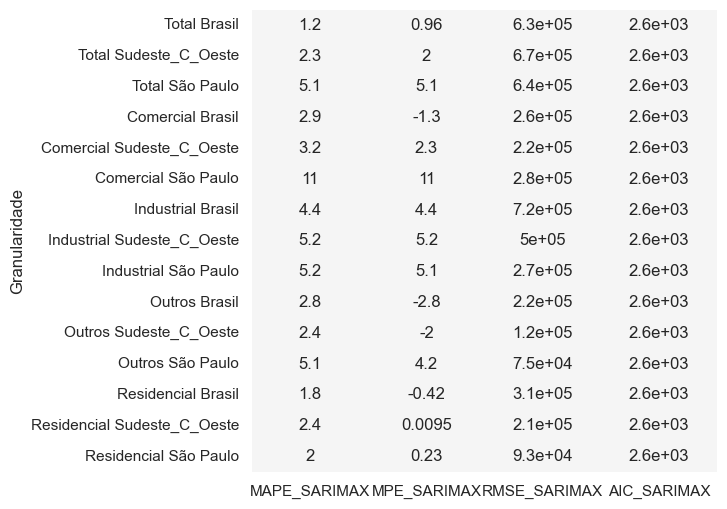

In [78]:
plt.figure(figsize=(6, 6))

cmap = sns.color_palette(["#f5f5f5"])
df_metricas3.set_index('Granularidade', inplace=True)
                      
sns.heatmap(df_metricas3, annot=True, cmap=cmap, cbar= False)
plt.savefig("sarimax/"+"tabela_sarimax", bbox_inches="tight")

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=2866.242, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=2862.824, Time=0.01 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=2864.521, Time=0.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=2864.268, Time=0.07 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=2862.909, Time=0.03 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=2863.343, Time=0.20 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.14 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=2864.014, Time=0.02 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=2863.999, Time=0.02 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=2865.999, Time=0.07 sec
 ARIMA(0,1,0)(0,1,0)[12] intercept   : AIC=2863.986, Time=0.02 sec

Best model:  ARIMA(0,1,0)(0,1,0)[12]          
Total fit time: 0.724 seconds
Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=2747.039, Time=0.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             

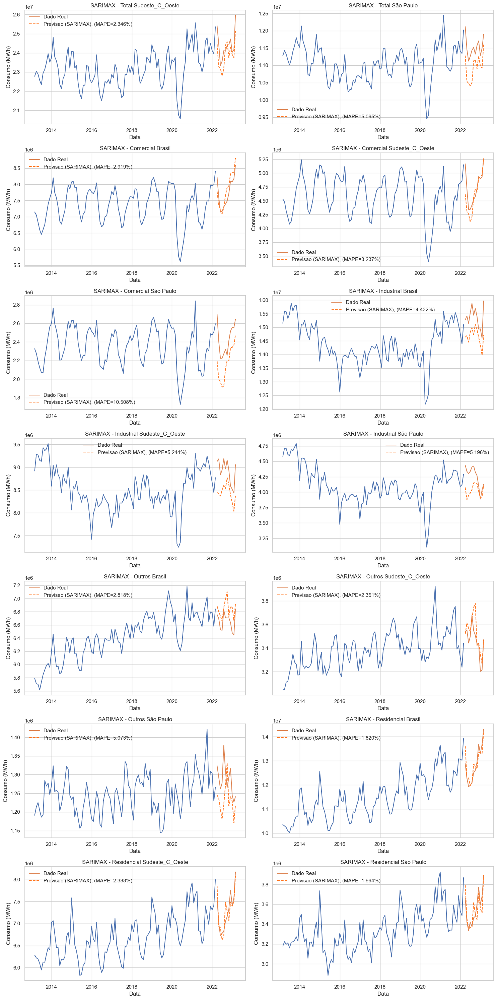

In [79]:
fig, axs = plt.subplots(nrows=7, ncols=2, figsize=(15, 30))

for serie, grupo, ax in zip(series_temporais[1:], lista_regiao[1:], axs.flat):
    if i != 0:

        train = serie.groupby(['Data_padrao'])['Valor'].sum()
        test = serie.groupby(['Data_padrao'])['Valor'].sum()
        train = train.iloc[110:-12]
        test = test.iloc[-12:]

        # Cálculo do SARIMA
        # Cálculo do Holt Winters
        SARIMAX_model = pm.auto_arima(train, exogenous=train_exog,
                               start_p=1, start_q=1,
                               test='adf',
                               max_p=5, max_q=5, m=12,
                               start_P=0, seasonal=True,
                               d=None, D=1, 
                               trace=True,
                               error_action='ignore',  
                               suppress_warnings=True, 
                               stepwise=True)

        #print(model.summary())

        fitted, confint = SARIMAX_model.predict(n_periods=12, 
                                                return_conf_int=True,
                                                exogenous=test_exog)

        index_of_fc = pd.date_range(train.index[-1] + pd.DateOffset(months=1), periods = 12, freq='MS')

        fitted_series = pd.Series(fitted, index=index_of_fc)

        mape = mean_absolute_percentage_error(test, fitted_series)*100

        ax.plot(train)
        ax.plot(test, label='Dado Real')
        ax.plot(fitted_series, linestyle='--', color='#ff7823', label="Previsao (SARIMAX), (MAPE={:0.3f}%)".format(mape))
        ax.legend()
        ax.set_ylabel("Consumo (MWh)")
        ax.set_xlabel("Data")
        ax.set_title("SARIMAX - {}".format(grupo))

# Ajusta o layout para evitar sobreposição de rótulos
plt.tight_layout()
# Salva a figura
plt.savefig('sarimax/' + "previsao_sarimax_todas.png", bbox_inches="tight")
plt.show()

## Prophet

13:10:34 - cmdstanpy - INFO - Chain [1] start processing
13:10:34 - cmdstanpy - INFO - Chain [1] done processing
13:10:35 - cmdstanpy - INFO - Chain [1] start processing
13:10:35 - cmdstanpy - INFO - Chain [1] done processing
13:10:35 - cmdstanpy - INFO - Chain [1] start processing
13:10:35 - cmdstanpy - INFO - Chain [1] done processing
13:10:36 - cmdstanpy - INFO - Chain [1] start processing
13:10:36 - cmdstanpy - INFO - Chain [1] done processing
13:10:36 - cmdstanpy - INFO - Chain [1] start processing
13:10:36 - cmdstanpy - INFO - Chain [1] done processing
13:10:37 - cmdstanpy - INFO - Chain [1] start processing
13:10:37 - cmdstanpy - INFO - Chain [1] done processing
13:10:37 - cmdstanpy - INFO - Chain [1] start processing
13:10:37 - cmdstanpy - INFO - Chain [1] done processing
13:10:37 - cmdstanpy - INFO - Chain [1] start processing
13:10:37 - cmdstanpy - INFO - Chain [1] done processing
13:10:38 - cmdstanpy - INFO - Chain [1] start processing
13:10:38 - cmdstanpy - INFO - Chain [1]

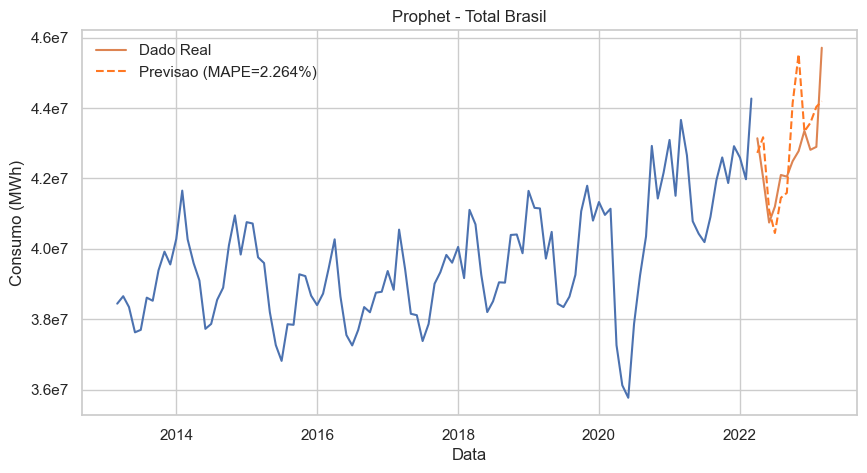

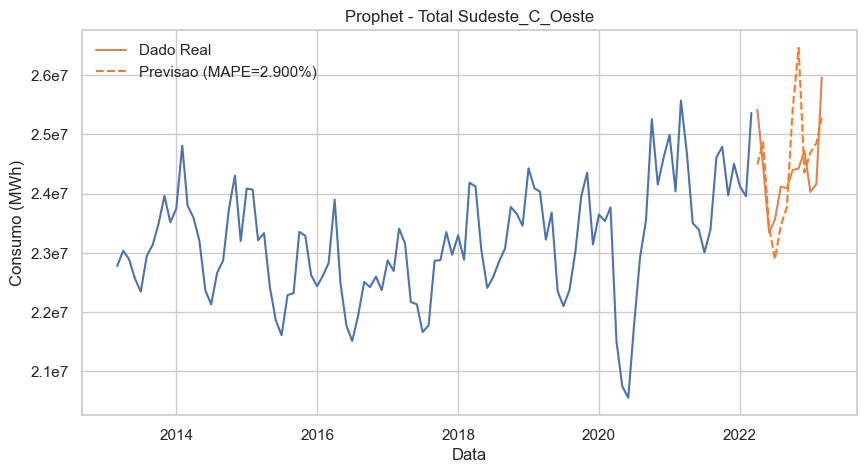

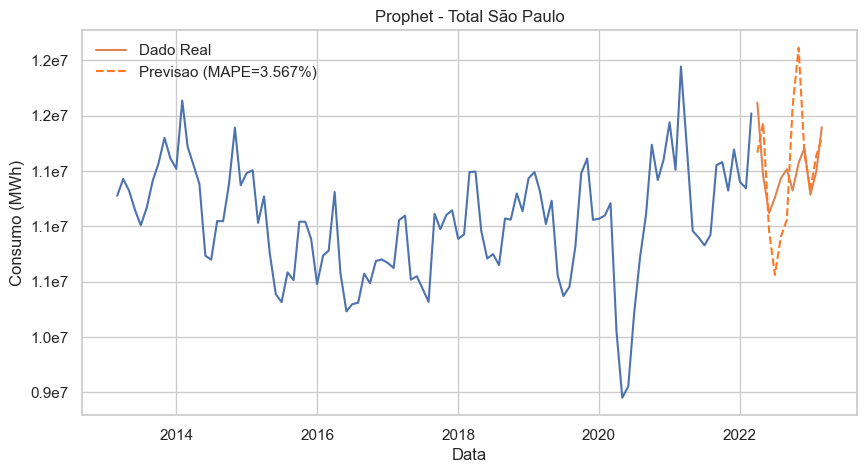

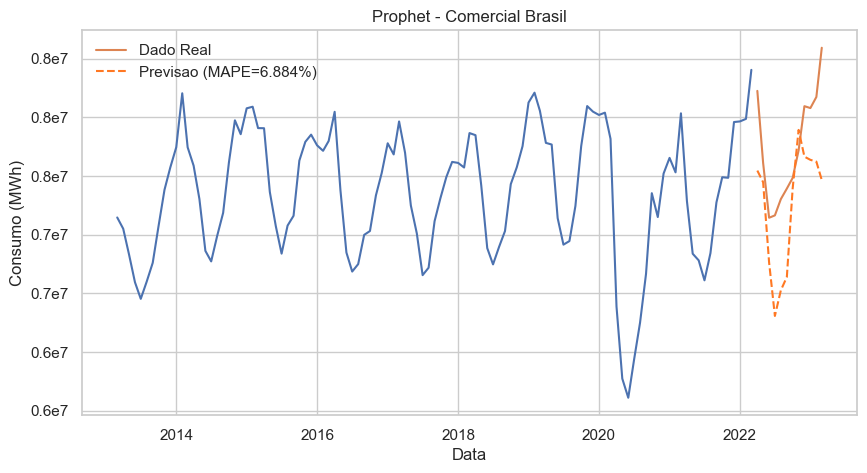

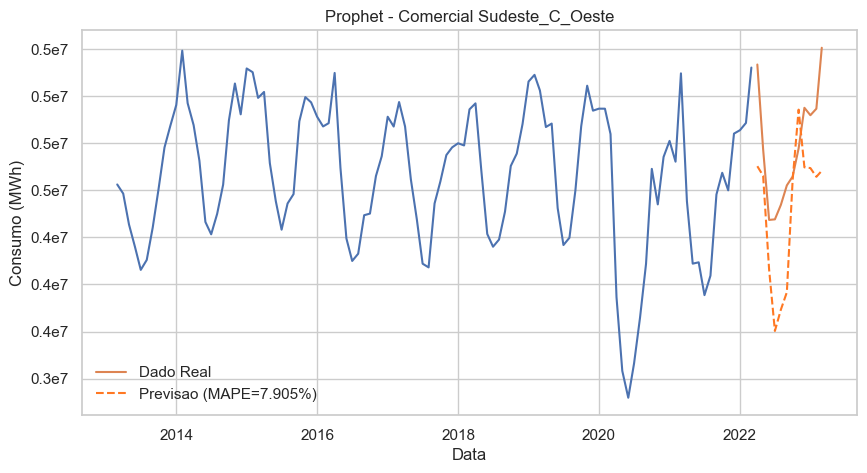

...

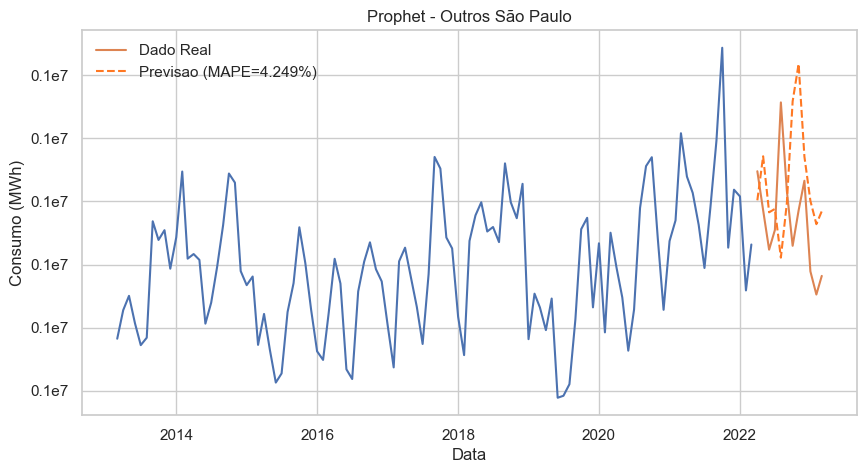

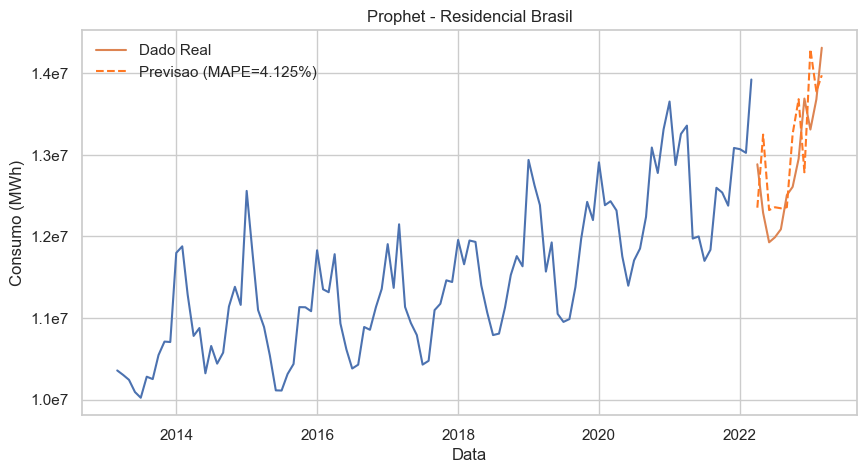

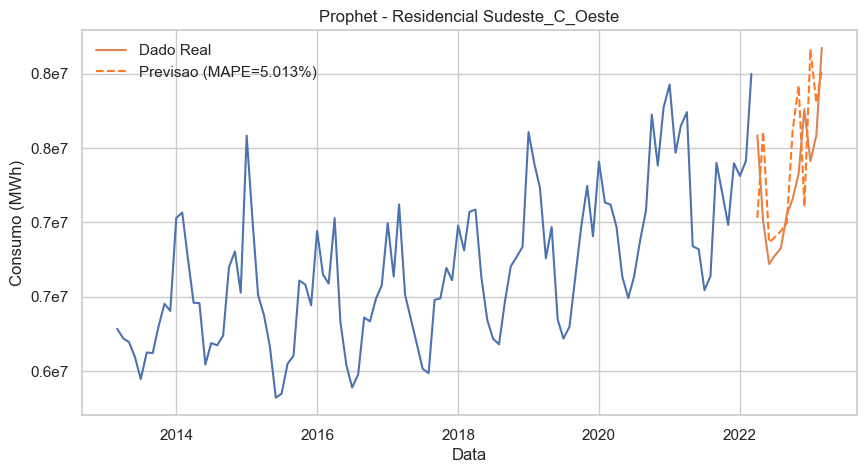

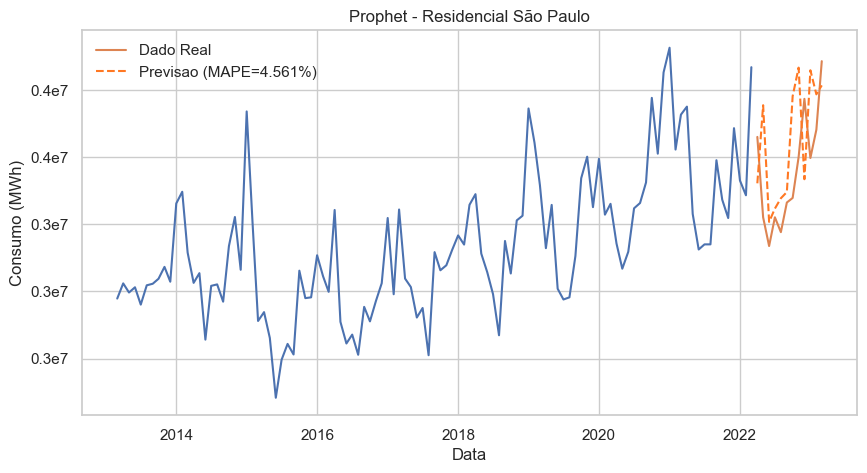

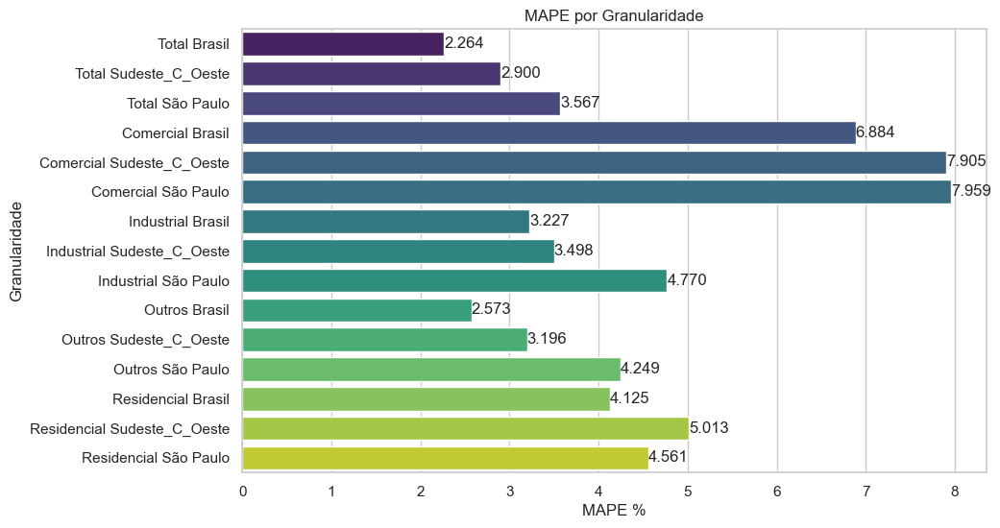

In [106]:
test_predictions=[]
lista_previsoes = []
mape_por_regiao = []
rmse_por_regiao = []
mpe_por_regiao = []
aic_results = []

from matplotlib.ticker import FuncFormatter

# Função de formatação personalizada para notação científica com um dígito antes do ponto decimal e expoente 7
def sci_formatter(x, pos):
    return "{:.1f}e7".format(x / 1e7)

for serie, grupo in zip(series_temporais, lista_regiao):
      
    serie_tb = serie.drop(columns=['Granularidade'])
    serie_tb = serie_tb.reset_index()
    serie_tb = serie_tb.rename(columns = {'Data_padrao' : 'ds', 'Valor' : 'y'})
    train = serie_tb.iloc[110:-12]
    test = serie_tb.iloc[-12:]
    concat = serie_tb.iloc[110:]
    concat = concat.reset_index()

    
    m = Prophet(yearly_seasonality=True)

    model_fit = m.fit(train)

    future = m.make_future_dataframe(periods=len(test), freq='m')
    forecast = m.predict(future)
    
    test_predictions = forecast[["yhat"]]
    test_predictions = pd.concat([test_predictions, concat], axis=1)
    test_predictions = test_predictions.iloc[-12:]

    
    train = train.groupby(['ds'])['y'].sum()
    test = test.groupby(['ds'])['y'].sum()
    test_predictions = test_predictions.groupby(['ds'])['yhat'].sum()
    
    mape = mean_absolute_percentage_error(test, test_predictions)*100
    rmse = mean_squared_error(test, test_predictions,  squared=False)
    mpe = mean_percentage_error(test, test_predictions)
    
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(test_predictions, linestyle='--', color='#ff7823', label="Previsao (MAPE={:0.3f}%)".format(mape));
    ax.legend();
    ax.set_title("Prophet - {}".format( grupo ));
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")
    #ax.yaxis.set_major_formatter(FormatStrFormatter(f"%.1f"))
    ax.yaxis.set_major_formatter(FuncFormatter(sci_formatter))
    
    
    # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_FB': mape})
    rmse_por_regiao.append({'Granularidade': grupo, 'RMSE_FB': rmse})
    mpe_por_regiao.append({'Granularidade': grupo, 'MPE_FB': mpe})

    # Restante do código para plotar os resultados
    # ...
    
    plt.savefig('fb/'+"previsao_fb_" + grupo + ".png", bbox_inches="tight")

# Criação do DataFrame com os valores de MAPE por região
df_mape = pd.DataFrame(mape_por_regiao)
df_rmse = pd.DataFrame(rmse_por_regiao)
df_mpe = pd.DataFrame(mpe_por_regiao)
df_aic = pd.DataFrame(aic_results)

df_metricas4 = pd.merge(df_mape, df_mpe, on='Granularidade').merge(df_rmse, on='Granularidade')

# Ordenar o DataFrame por MAPE
#df_mape = df_mape.sort_values(by='MAPE', ascending=False)

# Configurar estilo Seaborn
sns.set(style="whitegrid")

# Criar o gráfico de barras com cores
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_FB', y='Granularidade', data=df_mape, palette="viridis",  ci=None)
plt.xlabel("MAPE %")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")
for p in ax.patches:
    ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.3f}', va='center')

plt.savefig('fb/'+"mape_fb", bbox_inches="tight")
plt.show()

    #train_predictions = forecast[["yhat"]][train.index.start:train.index.stop]
    #test_predictions = forecast[["yhat"]][test.index.start:test.index.stop]
    
    #print("Training")
    #print("Mean Absolute Percentage Error: ",np.round(mean_absolute_percentage_error(train[["y"]],train_predictions)*100,2))
    #print("Mean Absolute Error: ",np.round(mean_absolute_error(train[["y"]],train_predictions),2))

    #plt.figure(figsize=(20,7))
    #plt.plot(train,label="trainig actuals")
    #plt.plot(train_predictions,label="training predictions",marker="*")
    #print("Testing")
    #print("Mean Absolute Percentage Error: ",np.round(mean_absolute_percentage_error(test[["y"]],test_predictions)*100,2))
    #print("Mean Absolute Error: ",np.round(mean_absolute_error(test[["y"]],test_predictions),2))
    #plt.plot(test,label="testing actuals")
    #plt.plot(test_predictions,label="testing predictions",c="orange")
    #plt.plot(forecast[["yhat"]][test.index.stop:],label="Forecast",c="green")
    #plt.legend()
    #plt.show()

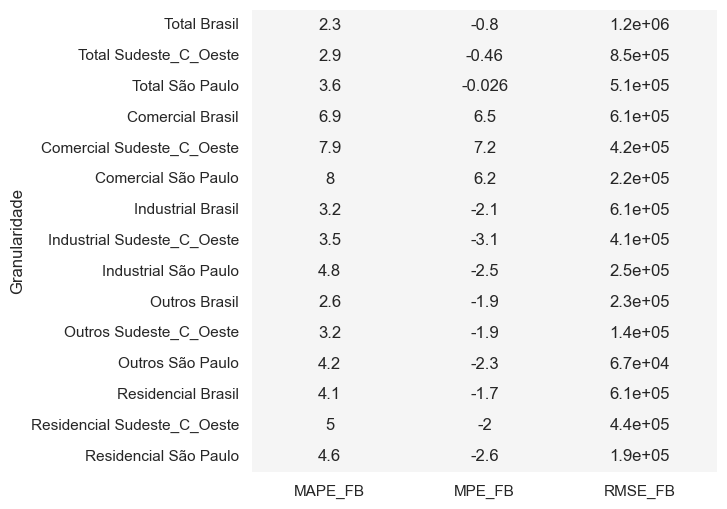

In [81]:
plt.figure(figsize=(6, 6))

cmap = sns.color_palette(["#f5f5f5"])
df_metricas4.set_index('Granularidade', inplace=True)
                      
sns.heatmap(df_metricas4, annot=True, cmap=cmap, cbar= False)
plt.savefig("fb/"+"tabela_fb", bbox_inches="tight")

In [107]:
images = [Image.open('fb/'+"previsao_fb_" + grupo + ".png") for grupo in lista_regiao[1:]]
#total_width = max(img.width for img in images)* 2
#total_height = sum(img.height for img in images)
#combined_image = Image.new('RGB', (total_width, total_height))
    
# Calcular o número de linhas e colunas
num_columns = 2
num_rows = 7

# Calcular a largura e altura de cada célula
cell_width = max(img.width for img in images)
cell_height = sum(img.height for img in images) // num_rows//2

# Calcular as dimensões totais da imagem combinada
total_width = cell_width * num_columns
total_height = cell_height * num_rows

# Criar uma nova imagem combinada
combined_image = Image.new('RGB', (total_width, total_height))

for row in range(num_rows):
    for col in range(num_columns):
        index = row * num_columns + col
        if index < len(images):
            img = images[index]
            # Calcular as coordenadas para colar a imagem
            x_offset = col * cell_width
            y_offset = row * cell_height
            # Colar a imagem na célula correspondente
            combined_image.paste(img, (x_offset, y_offset))


combined_image.save("fb/"+"fb_todas" + ".png", bbox_inches="tight")
combined_image.show()

## Comparação final

In [83]:
merged_df = pd.merge(df_metricas, df_metricas1, on='Granularidade', how='inner')
merged_df = pd.merge(merged_df, df_metricas2, on='Granularidade', how='inner')
merged_df = pd.merge(merged_df, df_metricas3, on='Granularidade', how='inner')
merged_df = pd.merge(merged_df, df_metricas4, on='Granularidade', how='inner')
merged_df = merged_df.reset_index()
merged_df

,Granularidade,MAPE_SMA,MPE_SMA,RMSE_SMA,MAPE_HW,MPE_HW,RMSE_HW,AIC_HW,MAPE_SARIMA,MPE_SARIMA,RMSE_SARIMA,AIC_SARIMA,MAPE_SARIMAX,MPE_SARIMAX,RMSE_SARIMAX,AIC_SARIMAX,MAPE_FB,MPE_FB,RMSE_FB
0,Total Brasil,4.504500,-3.978140,2.044055e+06,1.149350,-0.317055,617720.878572,2998.665598,0.931289,-0.080530,484482.030587,2576.989842,1.188759,0.964062,634496.783533,2576.989842,2.264312,-0.799834,1.201440e+06
1,Total Sudeste_C_Oeste,4.480497,-4.060174,1.192241e+06,1.790694,0.588630,556442.437918,2916.677510,2.345642,2.003822,667912.960175,2576.989842,2.345642,2.003822,667912.960175,2576.989842,2.899914,-0.463679,8.517549e+05
2,Total São Paulo,4.573571,-4.441245,5.721362e+05,1.854707,1.128416,277709.013582,2786.776585,5.094739,5.094739,639551.435888,2576.989842,5.094739,5.094739,639551.435888,2576.989842,3.567122,-0.025707,5.106394e+05
3,Comercial Brasil,9.191323,-8.825970,7.969751e+05,4.843719,-4.327268,406054.002381,2730.841950,2.918971,-1.252459,259805.726919,2576.989842,2.918971,-1.252459,259805.726919,2576.989842,6.884157,6.509461,6.142015e+05
4,Comercial Sudeste_C_Oeste,9.549372,-9.164128,5.082035e+05,4.531541,-2.980552,248477.523826,2660.285011,3.236672,2.287872,223499.883336,2576.989842,3.236672,2.287872,223499.883336,2576.989842,7.905098,7.178825,4.222847e+05
5,Comercial São Paulo,8.480405,-7.543446,2.349068e+05,3.381345,2.275559,126299.747825,2551.757753,10.508025,10.508025,279790.079607,2576.989842,10.508025,10.508025,279790.079607,2576.989842,7.959414,6.230670,2.178226e+05
6,Industrial Brasil,2.514131,1.576182,4.608605e+05,2.151742,2.151742,389717.132274,2825.339912,4.431581,4.431581,719024.327655,2576.989842,4.431581,4.431581,719024.327655,2576.989842,3.226531,-2.084788,6.117762e+05
7,Industrial Sudeste_C_Oeste,3.010384,1.487485,2.907983e+05,2.424011,2.424011,307152.514084,2734.539431,5.244143,5.244143,498923.458012,2576.989842,5.244143,5.244143,498923.458012,2576.989842,3.498222,-3.114070,4.057135e+05
8,Industrial São Paulo,3.157814,-1.184222,1.710831e+05,2.916738,-0.082721,145923.451988,2621.401092,5.196277,5.121556,269195.651440,2576.989842,5.196277,5.121556,269195.651440,2576.989842,4.769566,-2.486444,2.460786e+05
9,Outros Brasil,2.846499,-2.846499,2.254602e+05,3.087229,-2.721688,268604.724685,2602.176351,2.644741,-2.644229,214734.864898,2576.989842,2.818311,-2.818311,221226.518379,2576.989842,2.573480,-1.937575,2.281854e+05


In [84]:
merged_df['MAPE_SARIMAX'].sum()

56.60930893778883

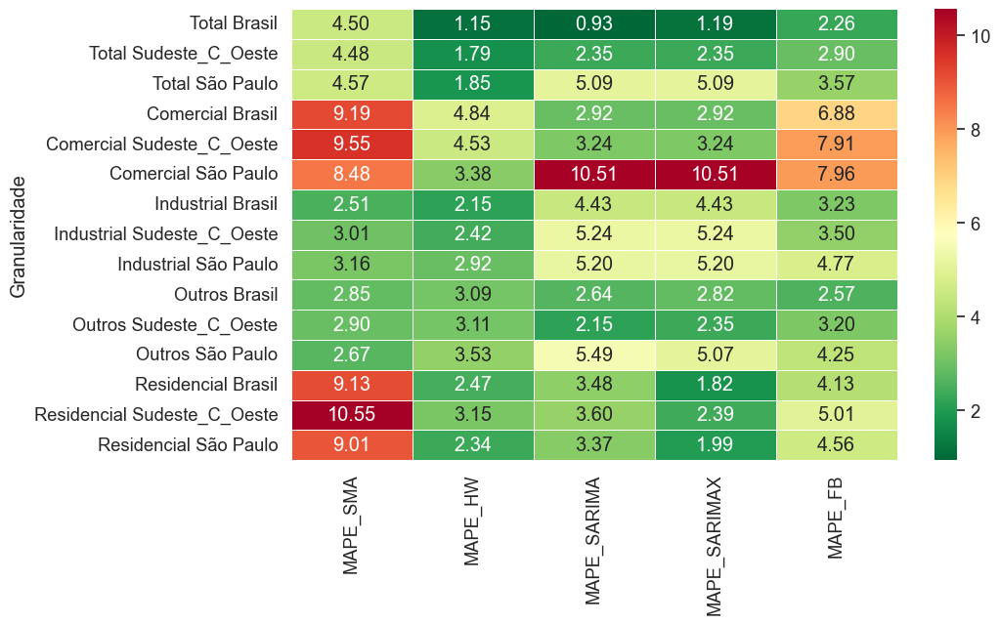

In [85]:
merged_df_mape = merged_df[['Granularidade', 'MAPE_SMA', 'MAPE_HW', 'MAPE_SARIMA', 'MAPE_SARIMAX', 'MAPE_FB']]
merged_df_mape.set_index('Granularidade', inplace=True)

sns.set(font_scale=1.2)
plt.figure(figsize=(10, 6))
ax = sns.heatmap(merged_df_mape, cmap='RdYlGn_r', annot=True, fmt=".2f", linewidths=.5)

# Definir rótulos das linhas
ax.set_yticklabels(merged_df_mape.index, rotation=0)

plt.savefig('erros/'+"mape_erros", bbox_inches="tight")
plt.show()

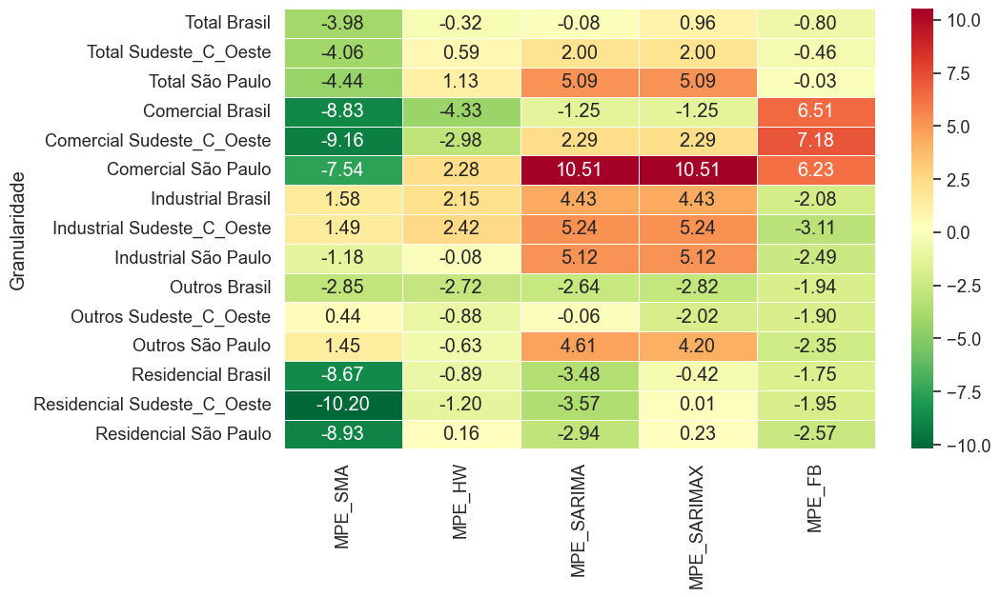

In [86]:
merged_df_mpe = merged_df[['Granularidade', 'MPE_SMA', 'MPE_HW', 'MPE_SARIMA', 'MPE_SARIMAX', 'MPE_FB']]
merged_df_mpe.set_index('Granularidade', inplace=True)

sns.set(font_scale=1.2)
plt.figure(figsize=(10, 6))
ax = sns.heatmap(merged_df_mpe, cmap='RdYlGn_r', annot=True, fmt=".2f", linewidths=.5)

# Definir rótulos das linhas
ax.set_yticklabels(merged_df_mape.index, rotation=0)

plt.savefig('erros/'+"mpe_erros", bbox_inches="tight")
plt.show()

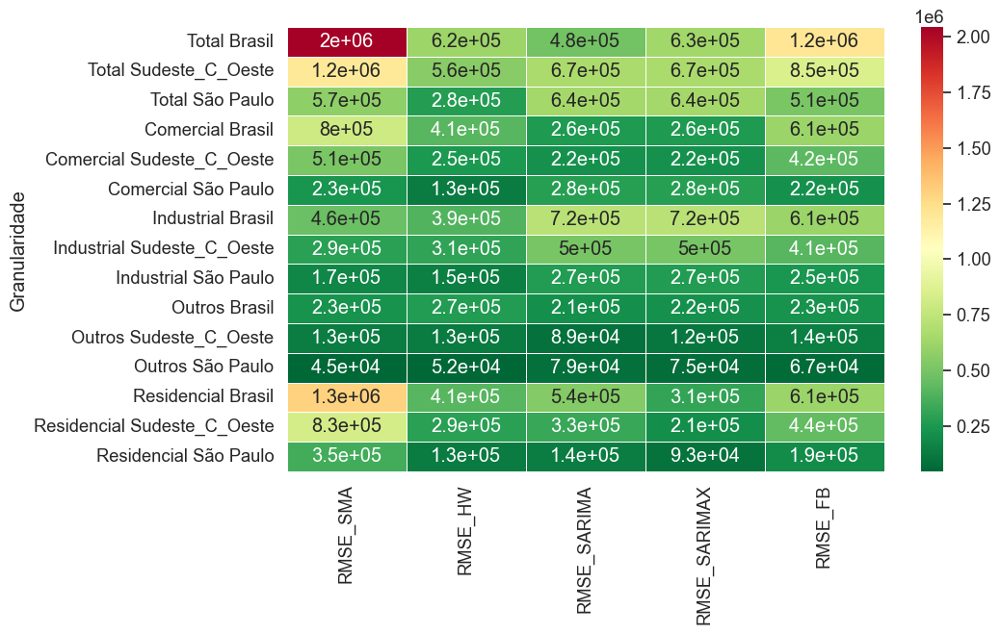

In [87]:
merged_df_rmse = merged_df[['Granularidade', 'RMSE_SMA', 'RMSE_HW', 'RMSE_SARIMA', 'RMSE_SARIMAX', 'RMSE_FB']]
merged_df_rmse.set_index('Granularidade', inplace=True)

from sklearn.preprocessing import MinMaxScaler

#scaler = MinMaxScaler()
#merged_df_rmse1 = scaler.fit_transform(merged_df_rmse)

sns.set(font_scale=1.2)
plt.figure(figsize=(10, 6))
ax = sns.heatmap(merged_df_rmse, cmap='RdYlGn_r', annot=True, fmt=".2g", linewidths=.5)

# Definir rótulos das linhas
ax.set_yticklabels(merged_df_rmse.index, rotation=0)

plt.savefig('erros/'+"RMSE_erros", bbox_inches="tight")
plt.show()

## Teste Final

In [92]:
## Base final
lista_final = ['Total Brasil', 'Total Sudeste_C_Oeste', 'Total São Paulo']

path1 = path_atual / 'Dados de Input/dados_futuros.csv'
df_futuro = pd.read_csv(path1, sep =';', encoding='utf8')
df_futuro['Data_padrao'] = pd.to_datetime(df_futuro['Data_padrao'], format='%d/%m/%Y')

series_temporais_finais = []

for i in lista_final:
    Grupo2 = df_futuro[(df_futuro['Granularidade'].str.contains(i))]
    series_temporais_finais.append(Grupo2)
series_temporais_finais

[  Data_padrao Granularidade        Valor
 0  2023-04-01  Total Brasil  44721752.99
 1  2023-05-01  Total Brasil  43182969.70
 2  2023-06-01  Total Brasil  42563232.31,
   Data_padrao          Granularidade        Valor
 3  2023-04-01  Total Sudeste_C_Oeste  25384784.97
 4  2023-05-01  Total Sudeste_C_Oeste  24387302.48
 5  2023-06-01  Total Sudeste_C_Oeste  24177109.69,
   Data_padrao    Granularidade        Valor
 6  2023-04-01  Total São Paulo  12014340.05
 7  2023-05-01  Total São Paulo  11187170.51
 8  2023-06-01  Total São Paulo  10986750.76]

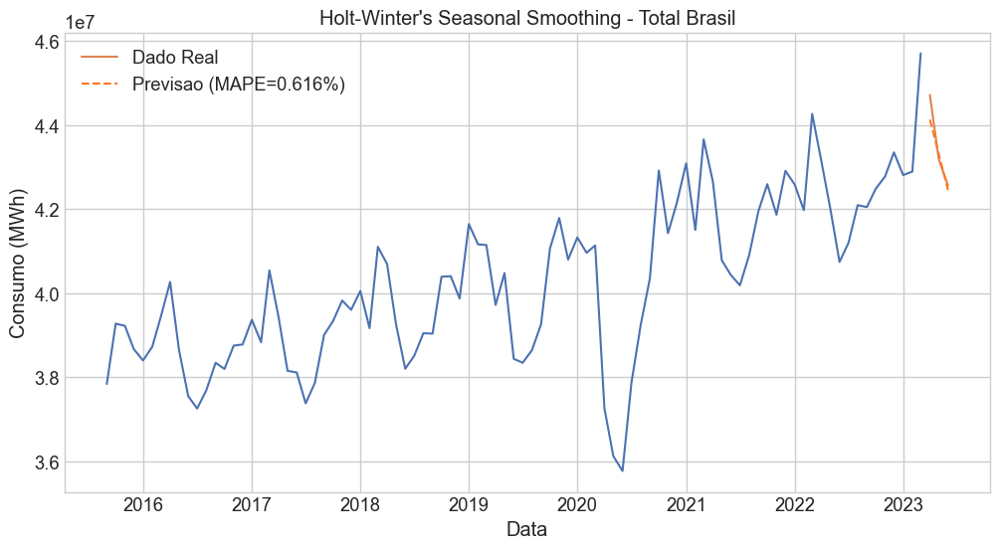

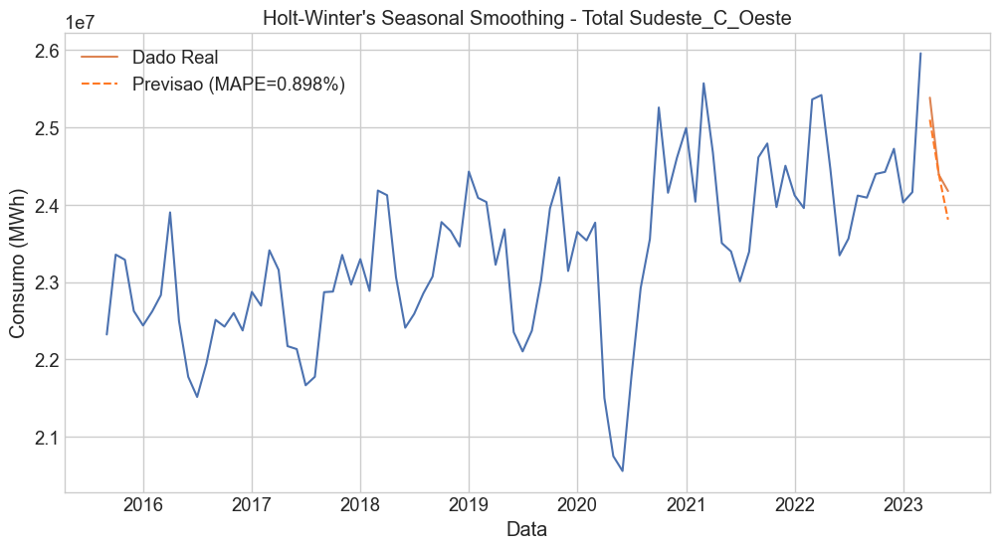

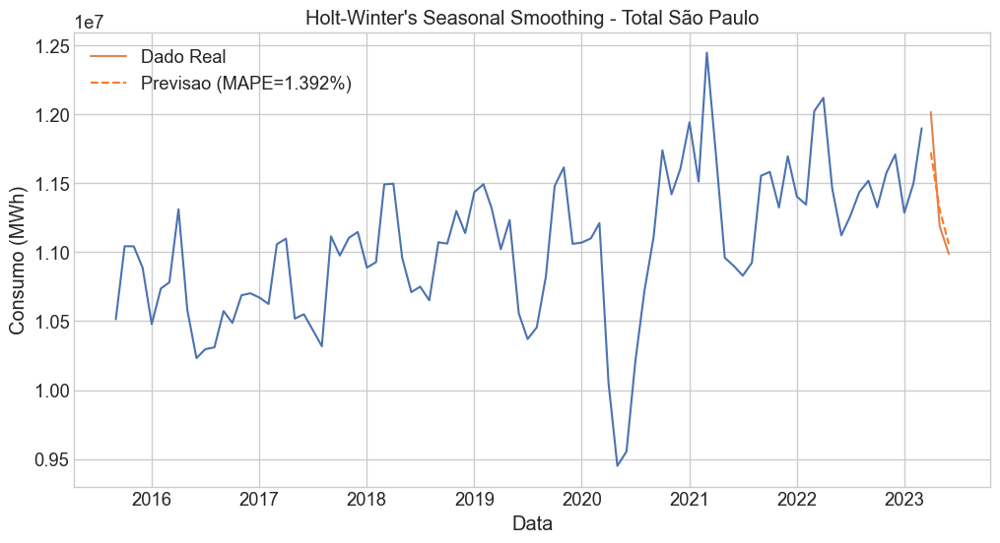

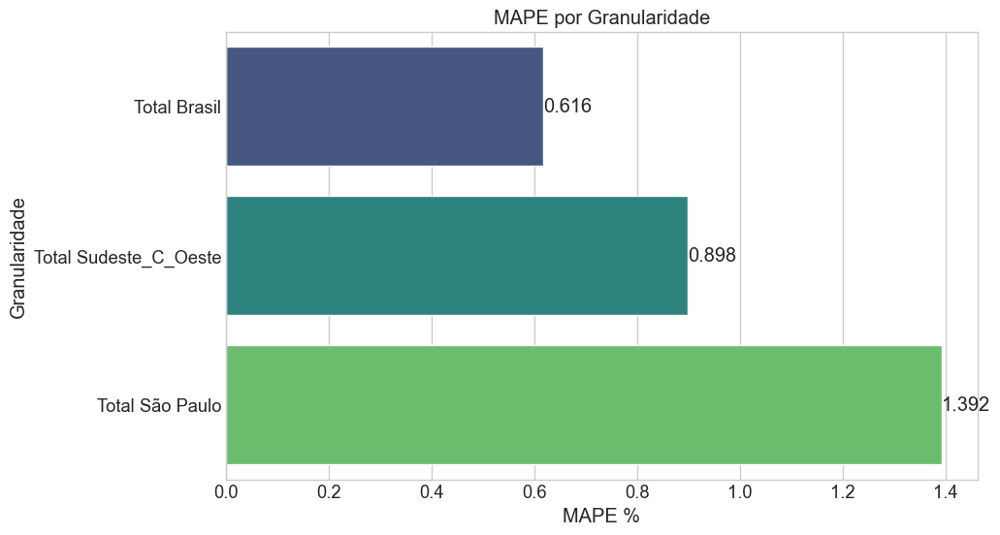

In [93]:
mape_por_regiao = []

lista_final = ['Total Brasil', 'Total Sudeste_C_Oeste', 'Total São Paulo']
plt.style.use('seaborn-whitegrid')

for serie, serie_final, grupo in zip(series_temporais, series_temporais_finais, lista_final):
    train = serie.groupby(['Data_padrao'])['Valor'].sum()
    test = serie_final.groupby(['Data_padrao'])['Valor'].sum()
    train = train.iloc[140:]
    
    # Cálculo do Holt Winters
    model = ExponentialSmoothing(train, trend="add", seasonal="add", seasonal_periods=12)
    fit = model.fit()
    pred = fit.forecast(3)
    
    mape = mean_absolute_percentage_error(test, pred) *100
    aic = fit.aic
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(train);
    ax.plot(test, label='Dado Real');
    ax.plot(pred, linestyle='--', color='#ff7823', label="Previsao (MAPE={:0.3f}%)".format(mape));
    ax.legend();
    ax.set_title("Holt-Winter's Seasonal Smoothing - {}".format( grupo ));
    ax.set_ylabel("Consumo (MWh)")
    ax.set_xlabel("Data")
    
    plt.savefig('final/'+"previsao_hw_" + grupo + ".png", bbox_inches="tight")
    
        # Armazena o MAPE por região
    mape_por_regiao.append({'Granularidade': grupo, 'MAPE_HW': mape})

# Criação do DataFrame com os valores de MAPE por região
df_mape_final = pd.DataFrame(mape_por_regiao)

# Criar o gráfico de barras com cores
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='MAPE_HW', y='Granularidade', data=df_mape_final, palette="viridis",  ci=None)
plt.xlabel("MAPE %")
plt.ylabel("Granularidade")
plt.title("MAPE por Granularidade")
for p in ax.patches:
    ax.text(p.get_width(), p.get_y() + p.get_height() / 2, f'{p.get_width():.3f}', va='center')
plt.savefig('final/'+"mape_final", bbox_inches="tight")
plt.show()